# Comp1-传统组学

主要适配于传统组学的建模和刻画。典型的应用场景探究rad_score最最终临床诊断的作用。

数据的一般形式为(具体文件,文件夹名可以不同)：
1. `images`文件夹，存放研究对象所有的CT、MRI等数据。
2. `masks`文件夹, 存放手工（Manuelly）勾画的ROI区域。与images文件夹的文件意义对应。
3. `label.txt`文件，每个患者对应的标签，例如肿瘤的良恶性、5年存活状态等。

## Onekey步骤

1. 数据校验，检查数据格式是否正确。
2. 组学特征提取，如果第一步检查数据通过，则提取对应数据的特征。
3. 读取标注数据信息。
4. 特征与标注数据拼接。形成数据集。
5. 查看一些统计信息，检查数据时候存在异常点。
6. 正则化，将数据变化到服从 N~(0, 1)。
7. 通过相关系数，例如spearman、person等筛选出特征。
8. 构建训练集和测试集，这里使用的是随机划分，正常多中心验证，需要大家根据自己的场景构建两份数据。
9. 通过Lasso筛选特征，选取其中的非0项作为后续模型的特征。
10. 使用机器学习算法，例如LR、SVM、RF等进行任务学习。
11. 模型结果可视化，例如AUC、ROC曲线，混淆矩阵等。


In [ ]:
## 获得视频教程
from onekey_algo.custom.Manager import onekey_show
onekey_show('传统组学任务')

## 一、数据校验
首先需要检查诊断数据，如果显示`检查通过！`择可以正常运行之后的，否则请根据提示调整数据。

**注意**：这里要求images和masks文件夹中的文件名必须一一对应。e.g. `1.nii.gz`为images中的一个文件，在masks文件夹必须也存在一个`1.nii.gz`文件。

当然也可以使用自定义的函数，获取解析数据。

In [ ]:
# 数据检验视频
onekey_show('传统组学任务|数据检验')

### 指定数据

此模块有3个需要自己定义的参数

1. `mydir`: 数据存放的路径。
2. `labelf`: 每个样本的标注信息文件。
3. `labels`: 要让AI系统学习的目标，例如肿瘤的良恶性、T-stage等。

In [1]:
import os
from IPython.display import display
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
from onekey_algo import OnekeyDS as okds

os.makedirs('img', exist_ok=True)
os.makedirs('results', exist_ok=True)
os.makedirs('features', exist_ok=True)
# 设置数据目录
# mydir = r'你自己数据的路径'
mydir = r'D:\OnekeyDS\BREAST3'
# 对应的标签文件
# labelf = r'你自己标注数据的文件地址'
labelf = os.path.join(mydir, 'label.csv')
# 读取标签数据列名
labels = ['label']

### images和masks匹配

这里要求images和masks文件夹中的文件名必须一一对应。e.g. `1.nii.gz`为images中的一个文件，在masks文件夹必须也存在一个`1.nii.gz`文件。

当然也可以使用自定义的函数，获取解析数据。

In [2]:
from pathlib import Path
from onekey_algo.custom.components.Radiology import diagnose_3d_image_mask_settings, get_image_mask_from_dir

# 生成images和masks对，一对一的关系。也可以自定义替换。
images, masks = get_image_mask_from_dir(mydir, images='images', masks='masks')

# 自定义获取images和masks数据的方法，下面的例子为，每个样本一个文件夹，图像是以im.nii结尾，mask是以seg.nii结尾。
# def get_images_mask(mydir):
#     images = []
#     masks = []
#     for root, dirs, files in os.walk(mydir):
#         for f in files:
#             if f.endswith('im.nii'):
#                 images.append(os.path.join(root, f))
#             if f.endswith('seg.nii'):
#                 masks.append(os.path.join(root, f))
#     return images, masks
# images, masks = get_images_mask(mydir)

diagnose_3d_image_mask_settings(images, masks)
print(f'获取到{len(images)}个样本。')

检查通过！
获取到1397个样本。


# 传统组学特征

使用pyradiomics提取传统组学特征，正常这块不需要修改，下面是具体的Onekey封装的接口。

```python
def extract(self, images: Union[str, List[str]], 
            masks: Union[str, List[str]], labels: Union[int, List[int]] = 1, settings=None)
"""
    * images: List结构，待提取的图像列表。
    * masks: List结构，待提取的图像对应的mask，与Images必须一一对应。
    * labels: 提取标注为什么标签的特征。默认为提取label=1的。
    * settings: 其他提取特征的参数。默认为None。

"""
```

```python
def get_label_data_frame(self, label: int = 1, column_names=None, images='images', masks='labels')
"""
    * label: 获取对应label的特征。
    * columns_names: 默认为None，使用程序设定的列名即可。
"""
```
    
```python
def get_image_mask_from_dir(root, images='images', masks='labels')
"""
    * root: 待提取特征的目录。
    * images: root目录中原始数据的文件夹名。
    * masks: root目录中标注数据的文件夹名。
"""
```


In [ ]:
# 特征提取视频
onekey_show('传统组学任务|特征提取')

In [3]:
import warnings
import pandas as pd
 
warnings.filterwarnings("ignore")

from onekey_algo.custom.components.Radiology import ConventionalRadiomics

if os.path.exists('features/rad_features.csv'):
    rad_data = pd.read_csv('features/rad_features.csv', header=0)
else:
    # 如果要自定义一些特征提取方式，可以使用param_file。
    param_file = r'./custom_settings/exampleCT.yaml'
    #param_file = None
    radiomics = ConventionalRadiomics(param_file, correctMask=True)
    radiomics.extract(images, masks)
    rad_data = radiomics.get_label_data_frame(label=1)
    rad_data.columns = [c.replace('-', '_') for c in rad_data.columns]
    rad_data.to_csv('features/rad_features.csv', header=True, index=False)
rad_data

[2024-03-13 00:07:30 - Radiology.py: 169]	INFO	使用./custom_settings/exampleCT.yaml的配置文件。
[2024-03-13 00:07:31 - core.py: 188]	INFO	validation.valid
[2024-03-13 00:07:31 - Radiology.py: 200]	INFO	Extracting features...
[2024-03-13 00:07:31 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0001.nii.gz using label 1
[2024-03-13 00:07:32 - Radiology.py: 236]	ERROR	0001.nii.gz extract 1 error, Exception thrown in SimpleITK LabelShapeStatisticsImageFilter_GetBoundingBox: d:\a\1\sitk-build\itk-prefix\include\itk-5.1\itkLabelMap.hxx:151:
itk::ERROR: itk::ERROR: LabelMap(000001AF1E89F6D0): No label object with label 1.
[2024-03-13 00:07:32 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0001old.nii.gz using label 1
[2024-03-13 00:07:34 - Radiology.py: 236]	ERROR	0001old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 00:07:34 - Radiology.py: 220]	INFO		Extracting feature from D:

[2024-03-13 00:09:43 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0023.nii.gz using label 1
[2024-03-13 00:09:47 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0023old.nii.gz using label 1
[2024-03-13 00:09:53 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0024.nii.gz using label 1
[2024-03-13 00:09:54 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0024old.nii.gz using label 1
[2024-03-13 00:09:57 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0025.nii.gz using label 1
[2024-03-13 00:10:00 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0025old.nii.gz using label 1
[2024-03-13 00:10:02 - Radiology.py: 236]	ERROR	0025old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:10:02 - Radiology.py: 220]	INFO		Extracting feature from D:\Onek

[2024-03-13 00:12:24 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0047.nii.gz using label 1
[2024-03-13 00:12:26 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0047old.nii.gz using label 1
[2024-03-13 00:12:28 - Radiology.py: 236]	ERROR	0047old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 00:12:28 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0048.nii.gz using label 1
[2024-03-13 00:12:32 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0048old.nii.gz using label 1
[2024-03-13 00:12:34 - Radiology.py: 236]	ERROR	0048old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:12:34 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0049.nii.gz using label 1
[2024-03-13 00:12:37 - Radiology.py: 220]	INFO		Extrac

[2024-03-13 00:14:05 - Radiology.py: 236]	ERROR	0066.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:14:05 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0066old.nii.gz using label 1
[2024-03-13 00:14:08 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0067.nii.gz using label 1
[2024-03-13 00:14:09 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0067old.nii.gz using label 1
[2024-03-13 00:14:10 - Radiology.py: 236]	ERROR	0067old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:14:10 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0068.nii.gz using label 1
[2024-03-13 00:14:12 - Radiology.py: 236]	ERROR	0068.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00

[2024-03-13 00:15:39 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0086old.nii.gz using label 1
[2024-03-13 00:15:41 - Radiology.py: 236]	ERROR	0086old.nii.gz extract 1 error, Exception thrown in SimpleITK LabelShapeStatisticsImageFilter_GetBoundingBox: d:\a\1\sitk-build\itk-prefix\include\itk-5.1\itkLabelMap.hxx:151:
itk::ERROR: itk::ERROR: LabelMap(000001AF294076A0): No label object with label 1.
[2024-03-13 00:15:41 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0087.nii.gz using label 1
[2024-03-13 00:15:46 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0087old.nii.gz using label 1
[2024-03-13 00:15:49 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0088.nii.gz using label 1
[2024-03-13 00:15:53 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0088old.nii.gz using label 1
[2024-03-13 00:15:54 - Radiology.py: 236]	ERROR	0088old.nii.

[2024-03-13 00:17:55 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0108.nii.gz using label 1
[2024-03-13 00:17:57 - Radiology.py: 236]	ERROR	0108.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 00:17:57 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0108old.nii.gz using label 1
[2024-03-13 00:18:03 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0109.nii.gz using label 1
[2024-03-13 00:18:07 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0109old.nii.gz using label 1
[2024-03-13 00:18:10 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0110.nii.gz using label 1
[2024-03-13 00:18:12 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0110old.nii.gz using label 1
[2024-03-13 00:18:19 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3

[2024-03-13 00:21:31 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0132old.nii.gz using label 1
[2024-03-13 00:21:34 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0133.nii.gz using label 1
[2024-03-13 00:21:40 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0133old.nii.gz using label 1
[2024-03-13 00:21:43 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0134.nii.gz using label 1
[2024-03-13 00:21:56 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0134old.nii.gz using label 1
[2024-03-13 00:21:57 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0135.nii.gz using label 1
[2024-03-13 00:22:05 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0136.nii.gz using label 1
[2024-03-13 00:22:13 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0137.nii.gz using

[2024-03-13 00:24:21 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0162old.nii.gz using label 1
[2024-03-13 00:24:23 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0163.nii.gz using label 1
[2024-03-13 00:24:28 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0163old.nii.gz using label 1
[2024-03-13 00:24:30 - Radiology.py: 236]	ERROR	0163old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:24:30 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0164.nii.gz using label 1
[2024-03-13 00:24:37 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0164old.nii.gz using label 1
[2024-03-13 00:24:42 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0165.nii.gz using label 1
[2024-03-13 00:24:46 - Radiology.py: 220]	INFO		Extracting feature from D:\Onek

[2024-03-13 00:27:19 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0194old.nii.gz using label 1
[2024-03-13 00:27:21 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0195.nii.gz using label 1
[2024-03-13 00:27:24 - Radiology.py: 236]	ERROR	0195.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 00:27:24 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0195old.nii.gz using label 1
[2024-03-13 00:27:25 - Radiology.py: 236]	ERROR	0195old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 00:27:25 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0196.nii.gz using label 1
[2024-03-13 00:27:28 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0196old.nii.gz using label 1
[2024-03-13 00:27:29 - Radiology.py: 236]	ERROR	0196old.nii.gz 

[2024-03-13 00:29:28 - Radiology.py: 236]	ERROR	0216old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:29:28 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0217.nii.gz using label 1
[2024-03-13 00:29:32 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0217old.nii.gz using label 1
[2024-03-13 00:29:34 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0218.nii.gz using label 1
[2024-03-13 00:29:37 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0218old.nii.gz using label 1
[2024-03-13 00:29:38 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0219.nii.gz using label 1
[2024-03-13 00:29:43 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0219old.nii.gz using label 1
[2024-03-13 00:29:45 - Radiology.py: 220]	INFO		Extracting feature from D:\Onek

[2024-03-13 00:31:43 - Radiology.py: 236]	ERROR	0243old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:31:43 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0244old.nii.gz using label 1
[2024-03-13 00:31:48 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0245old.nii.gz using label 1
[2024-03-13 00:31:52 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0246old.nii.gz using label 1
[2024-03-13 00:31:55 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0247old.nii.gz using label 1
[2024-03-13 00:31:59 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0248old.nii.gz using label 1
[2024-03-13 00:32:02 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0249old.nii.gz using label 1
[2024-03-13 00:32:07 - Radiology.py: 220]	INFO		Extracting feature fro

[2024-03-13 00:34:32 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0289old.nii.gz using label 1
[2024-03-13 00:34:33 - Radiology.py: 236]	ERROR	0289old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:34:33 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0290old.nii.gz using label 1
[2024-03-13 00:34:35 - Radiology.py: 236]	ERROR	0290old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:34:35 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0291old.nii.gz using label 1
[2024-03-13 00:34:39 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0292old.nii.gz using label 1
[2024-03-13 00:34:49 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0293old.nii.gz using label 1
[2024-03-13 00:34:51 - Radiology.py:

[2024-03-13 00:36:17 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0327old.nii.gz using label 1
[2024-03-13 00:36:18 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0328old.nii.gz using label 1
[2024-03-13 00:36:20 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0329old.nii.gz using label 1
[2024-03-13 00:36:23 - Radiology.py: 236]	ERROR	0329old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 00:36:23 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0330old.nii.gz using label 1
[2024-03-13 00:36:24 - Radiology.py: 236]	ERROR	0330old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:36:24 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0331old.nii.gz using label 1
[2024-03-13 00:36:25 - Radiology.py: 236]	ERR

[2024-03-13 00:37:43 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0366old.nii.gz using label 1
[2024-03-13 00:37:45 - Radiology.py: 236]	ERROR	0366old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 00:37:45 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0367old.nii.gz using label 1
[2024-03-13 00:37:47 - Radiology.py: 236]	ERROR	0367old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 00:37:47 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0368old.nii.gz using label 1
[2024-03-13 00:37:49 - Radiology.py: 236]	ERROR	0368old.nii.gz extract 1 error, Exception thrown in SimpleITK LabelShapeStatisticsImageFilter_GetBoundingBox: d:\a\1\sitk-build\itk-prefix\include\itk-5.1\itkLabelMap.hxx:151:
itk::ERROR: itk::ERROR: LabelMap(000001AF29405700): No label object with label 1.
[202

[2024-03-13 00:38:57 - Radiology.py: 236]	ERROR	0410old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 00:38:57 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0411old.nii.gz using label 1
[2024-03-13 00:38:59 - Radiology.py: 236]	ERROR	0411old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:38:59 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0412old.nii.gz using label 1
[2024-03-13 00:39:01 - Radiology.py: 236]	ERROR	0412old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:39:01 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0413old.nii.gz using label 1
[2024-03-13 00:39:03 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0414old.nii.gz using label 1
[2024-03-13

[2024-03-13 00:39:51 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0444old.nii.gz using label 1
[2024-03-13 00:39:52 - Radiology.py: 236]	ERROR	0444old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:39:52 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0445old.nii.gz using label 1
[2024-03-13 00:39:55 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0446old.nii.gz using label 1
[2024-03-13 00:39:59 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0447old.nii.gz using label 1
[2024-03-13 00:40:00 - Radiology.py: 236]	ERROR	0447old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:40:00 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0448old.nii.gz using label 1
[2024-03-13 00:40:03 - Radiology.py:

[2024-03-13 00:41:02 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0492old.nii.gz using label 1
[2024-03-13 00:41:05 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0493old.nii.gz using label 1
[2024-03-13 00:41:07 - Radiology.py: 236]	ERROR	0493old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:41:07 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0494old.nii.gz using label 1
[2024-03-13 00:41:10 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0495old.nii.gz using label 1
[2024-03-13 00:41:13 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0496old.nii.gz using label 1
[2024-03-13 00:41:18 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0497old.nii.gz using label 1
[2024-03-13 00:41:21 - Radiology.py: 220]	INFO		Extracting feature fro

[2024-03-13 00:42:11 - Radiology.py: 236]	ERROR	0528old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:42:11 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0529old.nii.gz using label 1
[2024-03-13 00:42:13 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0530old.nii.gz using label 1
[2024-03-13 00:42:17 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0531old.nii.gz using label 1
[2024-03-13 00:42:18 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0532old.nii.gz using label 1
[2024-03-13 00:42:21 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0533old.nii.gz using label 1
[2024-03-13 00:42:22 - Radiology.py: 236]	ERROR	0533old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:42:22 - Radiology.py:

[2024-03-13 00:43:02 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0567old.nii.gz using label 1
[2024-03-13 00:43:02 - Radiology.py: 236]	ERROR	0567old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 00:43:02 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0568old.nii.gz using label 1
[2024-03-13 00:43:04 - Radiology.py: 236]	ERROR	0568old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:43:04 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0569old.nii.gz using label 1
[2024-03-13 00:43:05 - Radiology.py: 236]	ERROR	0569old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:43:05 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0570old.nii.gz using label 1
[2024-03-13

[2024-03-13 00:44:26 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0602old.nii.gz using label 1
[2024-03-13 00:44:31 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0603old.nii.gz using label 1
[2024-03-13 00:44:33 - Radiology.py: 236]	ERROR	0603old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:44:33 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0604old.nii.gz using label 1
[2024-03-13 00:44:36 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0605old.nii.gz using label 1
[2024-03-13 00:44:37 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0606old.nii.gz using label 1
[2024-03-13 00:44:39 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0607old.nii.gz using label 1
[2024-03-13 00:44:41 - Radiology.py: 236]	ERROR	0607old.nii.gz extract

[2024-03-13 00:49:40 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0660old.nii.gz using label 1
[2024-03-13 00:49:45 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0661old.nii.gz using label 1
[2024-03-13 00:49:46 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0662old.nii.gz using label 1
[2024-03-13 00:49:47 - Radiology.py: 236]	ERROR	0662old.nii.gz extract 1 error, Exception thrown in SimpleITK LabelShapeStatisticsImageFilter_GetBoundingBox: d:\a\1\sitk-build\itk-prefix\include\itk-5.1\itkLabelMap.hxx:151:
itk::ERROR: itk::ERROR: LabelMap(000001AF2940AA60): No label object with label 1.
[2024-03-13 00:49:47 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0663old.nii.gz using label 1
[2024-03-13 00:49:49 - Radiology.py: 236]	ERROR	0663old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 00:49:49 - Radiol

[2024-03-13 00:51:01 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0699old.nii.gz using label 1
[2024-03-13 00:51:05 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0700old.nii.gz using label 1
[2024-03-13 00:51:06 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0701old.nii.gz using label 1
[2024-03-13 00:51:08 - Radiology.py: 236]	ERROR	0701old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:51:08 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0711old.nii.gz using label 1
[2024-03-13 00:51:10 - Radiology.py: 236]	ERROR	0711old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:51:10 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0712old.nii.gz using label 1
[2024-03-13 00:51:13 - Radiology.py:

[2024-03-13 00:52:16 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0747old.nii.gz using label 1
[2024-03-13 00:52:17 - Radiology.py: 236]	ERROR	0747old.nii.gz extract 1 error, Exception thrown in SimpleITK LabelShapeStatisticsImageFilter_GetBoundingBox: d:\a\1\sitk-build\itk-prefix\include\itk-5.1\itkLabelMap.hxx:151:
itk::ERROR: itk::ERROR: LabelMap(000001AF294070E0): No label object with label 1.
[2024-03-13 00:52:17 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0748old.nii.gz using label 1
[2024-03-13 00:52:18 - Radiology.py: 236]	ERROR	0748old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:52:18 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0749old.nii.gz using label 1
[2024-03-13 00:52:20 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0750old.nii.gz using label 1
[2024-03-13 00:52:22

[2024-03-13 00:53:10 - Radiology.py: 236]	ERROR	0780old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:53:10 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0781old.nii.gz using label 1
[2024-03-13 00:53:12 - Radiology.py: 236]	ERROR	0781old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 00:53:12 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0782old.nii.gz using label 1
[2024-03-13 00:53:13 - Radiology.py: 236]	ERROR	0782old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 00:53:13 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0783old.nii.gz using label 1
[2024-03-13 00:53:13 - Radiology.py: 236]	ERROR	0783old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimu

[2024-03-13 00:56:00 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0826old.nii.gz using label 1
[2024-03-13 00:56:04 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0827old.nii.gz using label 1
[2024-03-13 00:56:07 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0828old.nii.gz using label 1
[2024-03-13 00:56:08 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0829old.nii.gz using label 1
[2024-03-13 00:56:11 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0830old.nii.gz using label 1
[2024-03-13 00:56:16 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0831old.nii.gz using label 1
[2024-03-13 00:56:21 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0832old.nii.gz using label 1
[2024-03-13 00:56:26 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0833o

[2024-03-13 01:00:25 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0884old.nii.gz using label 1
[2024-03-13 01:00:36 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0885old.nii.gz using label 1
[2024-03-13 01:00:43 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0886old.nii.gz using label 1
[2024-03-13 01:00:49 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0887old.nii.gz using label 1
[2024-03-13 01:00:53 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0888old.nii.gz using label 1
[2024-03-13 01:00:57 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0889old.nii.gz using label 1
[2024-03-13 01:01:02 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0890old.nii.gz using label 1
[2024-03-13 01:01:11 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0891o

[2024-03-13 01:05:08 - Radiology.py: 236]	ERROR	0943old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 01:05:08 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0944old.nii.gz using label 1
[2024-03-13 01:05:10 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0945old.nii.gz using label 1
[2024-03-13 01:05:11 - Radiology.py: 236]	ERROR	0945old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 01:05:11 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0946old.nii.gz using label 1
[2024-03-13 01:05:13 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0947old.nii.gz using label 1
[2024-03-13 01:05:14 - Radiology.py: 236]	ERROR	0947old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13

[2024-03-13 01:06:42 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0989old.nii.gz using label 1
[2024-03-13 01:06:46 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0990old.nii.gz using label 1
[2024-03-13 01:06:46 - Radiology.py: 236]	ERROR	0990old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 01:06:46 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0991old.nii.gz using label 1
[2024-03-13 01:06:47 - Radiology.py: 236]	ERROR	0991old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 01:06:47 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\0992old.nii.gz using label 1
[2024-03-13 01:06:48 - Radiology.py: 236]	ERROR	0992old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13

[2024-03-13 01:07:54 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1030old.nii.gz using label 1
[2024-03-13 01:07:54 - Radiology.py: 236]	ERROR	1030old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 01:07:54 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1031old.nii.gz using label 1
[2024-03-13 01:07:55 - Radiology.py: 236]	ERROR	1031old.nii.gz extract 1 error, mask only contains 1 segmented voxel! Cannot extract features for a single voxel.
[2024-03-13 01:07:55 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1032old.nii.gz using label 1
[2024-03-13 01:07:57 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1033old.nii.gz using label 1
[2024-03-13 01:07:59 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1034old.nii.gz using label 1
[2024-03-13 01:08:02 - Radiology.py: 220]	INF

[2024-03-13 01:09:14 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1084old.nii.gz using label 1
[2024-03-13 01:09:16 - Radiology.py: 236]	ERROR	1084old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 01:09:16 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1085old.nii.gz using label 1
[2024-03-13 01:09:16 - Radiology.py: 236]	ERROR	1085old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 01:09:16 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1086old.nii.gz using label 1
[2024-03-13 01:09:17 - Radiology.py: 236]	ERROR	1086old.nii.gz extract 1 error, mask has too few dimensions (number of dimensions 1, minimum required 2)
[2024-03-13 01:09:17 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1087old.nii.gz using label 1
[2024-03-13 01:09:21 - Radiol

[2024-03-13 01:10:50 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1134old.nii.gz using label 1
[2024-03-13 01:11:06 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1135old.nii.gz using label 1
[2024-03-13 01:11:12 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1136old.nii.gz using label 1
[2024-03-13 01:11:14 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1137old.nii.gz using label 1
[2024-03-13 01:11:19 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1138old.nii.gz using label 1
[2024-03-13 01:11:24 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1139old.nii.gz using label 1
[2024-03-13 01:11:27 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1140old.nii.gz using label 1
[2024-03-13 01:11:29 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1141o

[2024-03-13 01:14:18 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1196old.nii.gz using label 1
[2024-03-13 01:14:22 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1197old.nii.gz using label 1
[2024-03-13 01:14:25 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1198old.nii.gz using label 1
[2024-03-13 01:14:29 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1199old.nii.gz using label 1
[2024-03-13 01:14:33 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1200old.nii.gz using label 1
[2024-03-13 01:14:34 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1201old.nii.gz using label 1
[2024-03-13 01:14:39 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1202old.nii.gz using label 1
[2024-03-13 01:14:40 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1203o

[2024-03-13 01:17:09 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1250old.nii.gz using label 1
[2024-03-13 01:17:13 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1251old.nii.gz using label 1
[2024-03-13 01:17:22 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1252old.nii.gz using label 1
[2024-03-13 01:17:24 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1253old.nii.gz using label 1
[2024-03-13 01:17:28 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1254old.nii.gz using label 1
[2024-03-13 01:17:32 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1255old.nii.gz using label 1
[2024-03-13 01:17:36 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1256old.nii.gz using label 1
[2024-03-13 01:17:43 - Radiology.py: 220]	INFO		Extracting feature from D:\OnekeyDS\BREAST3\images\1257o

,ID,exponential_firstorder_10Percentile,exponential_firstorder_90Percentile,exponential_firstorder_Energy,exponential_firstorder_Entropy,exponential_firstorder_InterquartileRange,exponential_firstorder_Kurtosis,exponential_firstorder_Maximum,exponential_firstorder_Mean,exponential_firstorder_MeanAbsoluteDeviation,...,wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis,wavelet_LLL_glszm_ZoneEntropy,wavelet_LLL_glszm_ZonePercentage,wavelet_LLL_glszm_ZoneVariance,wavelet_LLL_ngtdm_Busyness,wavelet_LLL_ngtdm_Coarseness,wavelet_LLL_ngtdm_Complexity,wavelet_LLL_ngtdm_Contrast,wavelet_LLL_ngtdm_Strength
0002.nii.gz,0002.nii.gz,1.035,2.559,9.030e+06,-3.203e-16,0.946,1.952,2.769,1.664,0.533,...,21299.111,0.111,3.170,1.000,0.000,0.100,0.014,73840.561,12168.797,338.422
0002old.nii.gz,0002old.nii.gz,0.789,1.223,3.006e+06,-3.203e-16,0.271,1.500,1.318,0.979,0.226,...,823.000,0.334,1.585,1.000,0.000,0.459,0.044,1233.000,1986.272,46.392
0004.nii.gz,0004.nii.gz,1.185,1.941,6.019e+06,-3.203e-16,0.454,1.917,2.020,1.591,0.302,...,11008.667,0.167,2.585,1.000,0.000,0.163,0.015,29220.756,16280.714,220.598
0004old.nii.gz,0004old.nii.gz,0.818,1.802,5.013e+06,-3.203e-16,0.551,2.032,2.067,1.297,0.378,...,4739.600,0.208,2.322,1.000,0.000,0.211,0.020,12883.100,9584.987,152.140
0006old.nii.gz,0006old.nii.gz,1.232,1.492,3.008e+06,-3.203e-16,0.162,1.500,1.555,1.342,0.142,...,4206.333,0.333,1.585,1.000,0.000,0.418,0.019,6924.000,25111.506,114.355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1268old.nii.gz,1268old.nii.gz,0.610,2.077,9.025e+06,-3.203e-16,1.172,1.290,2.203,1.380,0.594,...,44410.111,0.111,3.170,1.000,0.000,0.123,0.008,161308.163,40528.320,346.712
1269old.nii.gz,1269old.nii.gz,0.906,1.566,4.010e+06,-3.203e-16,0.444,1.544,1.655,1.225,0.282,...,8406.500,0.250,2.000,1.000,0.000,0.261,0.015,18331.333,34302.722,192.872
1270old.nii.gz,1270old.nii.gz,0.646,1.636,4.009e+06,-3.203e-16,0.717,1.635,1.811,1.085,0.434,...,12001.250,0.250,2.000,1.000,0.000,0.280,0.013,21666.833,47071.094,200.837
1271old.nii.gz,1271old.nii.gz,1.425,2.485,4.217e+07,-3.203e-16,0.580,2.680,3.045,1.975,0.399,...,32840.470,0.026,5.260,0.976,0.024,0.021,0.010,445978.816,1188.475,437.027


## 特征统计

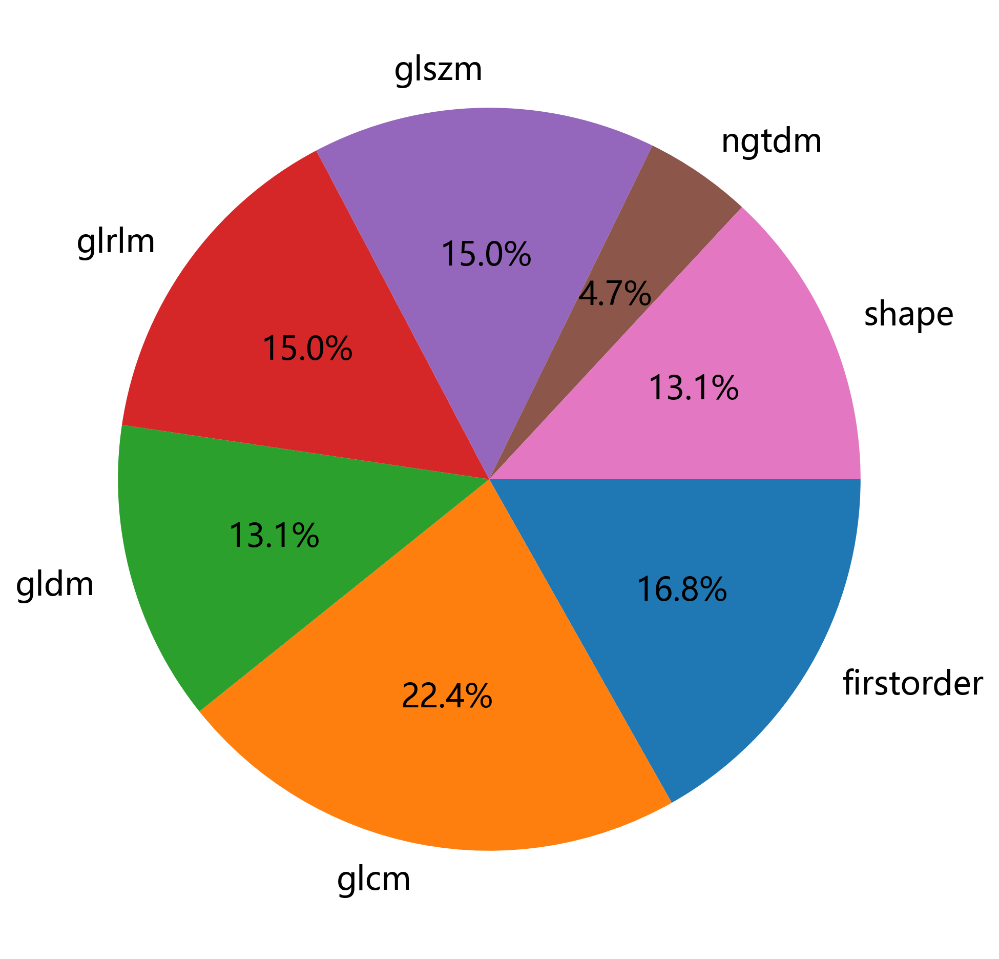

In [4]:
import matplotlib.pyplot as plt
sorted_counts = pd.DataFrame([c.split('_')[-2] for c in rad_data.columns if c !='ID']).value_counts()
sorted_counts = pd.DataFrame(sorted_counts, columns=['count']).reset_index()
sorted_counts = sorted_counts.sort_values(0)
plt.pie(sorted_counts['count'], labels=[i for i in sorted_counts[0]], startangle=0,
        counterclock = False, autopct = '%.1f%%')
plt.savefig(f'img/feature_ratio.svg', bbox_inches = 'tight')

## 标注数据

数据以csv格式进行存储，这里如果是其他格式，可以使用自定义函数读取出每个样本的结果。

要求label_data为一个`DataFrame`格式，包括ID列以及后续的labels列，可以是多列，支持Multi-Task。

In [5]:
label_data = pd.read_csv(labelf)
label_data.head()

,ID,label
0,0001old.nii.gz,0
1,0002old.nii.gz,0
2,0003old.nii.gz,0
3,0004old.nii.gz,0
4,0005old.nii.gz,0


## 特征拼接 

将标注数据`label_data`与`rad_data`进行合并，得到训练数据。

**注意：** 
1. 需要删掉ID这一列
2. 如果发现数据少了，需要自行检查数据是否匹配。

In [6]:
from onekey_algo.custom.utils import print_join_info
# 删掉ID这一列。
combined_data = pd.merge(rad_data, label_data, on=['ID'], how='inner')
ids = combined_data['ID']
combined_data = combined_data.drop(['ID'], axis=1)
print_join_info(rad_data, label_data)
print(combined_data[labels].value_counts())
combined_data.columns

[2023-12-03 22:09:56 - __init__.py:  55]	INFO	ID特征完全匹配！


label
0        941
1        456
dtype: int64


Index(['original_firstorder_10Percentile', 'original_firstorder_90Percentile',
       'original_firstorder_Energy', 'original_firstorder_Entropy',
       'original_firstorder_InterquartileRange',
       'original_firstorder_Kurtosis', 'original_firstorder_Maximum',
       'original_firstorder_Mean', 'original_firstorder_MeanAbsoluteDeviation',
       'original_firstorder_Median',
       ...
       'original_shape_Maximum2DDiameterRow',
       'original_shape_Maximum2DDiameterSlice',
       'original_shape_Maximum3DDiameter', 'original_shape_MeshVolume',
       'original_shape_MinorAxisLength', 'original_shape_Sphericity',
       'original_shape_SurfaceArea', 'original_shape_SurfaceVolumeRatio',
       'original_shape_VoxelVolume', 'label'],
      dtype='object', length=108)

## 获取到数据的统计信息

1. count，统计样本个数。
2. mean、std, 对应特征的均值、方差
3. min, 25%, 50%, 75%, max，对应特征的最小值，25,50,75分位数，最大值。

In [7]:
combined_data.describe()

,original_firstorder_10Percentile,original_firstorder_90Percentile,original_firstorder_Energy,original_firstorder_Entropy,original_firstorder_InterquartileRange,original_firstorder_Kurtosis,original_firstorder_Maximum,original_firstorder_Mean,original_firstorder_MeanAbsoluteDeviation,original_firstorder_Median,...,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,original_shape_Sphericity,original_shape_SurfaceArea,original_shape_SurfaceVolumeRatio,original_shape_VoxelVolume,label
count,1397.000,1397.000,1.397e+03,1397.000,1397.000,1397.000,1397.000,1397.000,1397.000,1397.000,...,1397.000,1397.000,1397.000,1397.000,1397.000,1397.000,1397.000,1397.000,1397.000,1397.000
mean,-24.713,71.003,2.610e+06,2.462,54.655,2.451,106.948,24.751,30.285,26.315,...,9.316,9.751,11.280,302.086,6.273,0.716,258.998,1.578,308.640,0.326
std,32.582,28.537,9.052e+06,0.416,19.438,0.566,40.427,27.568,9.855,29.871,...,10.026,5.327,10.400,1013.797,3.374,0.101,464.900,0.598,1024.062,0.469
min,-111.000,-39.400,4.458e+03,0.811,11.500,1.432,-20.000,-60.822,7.722,-67.000,...,1.863,2.168,2.520,3.214,1.536,0.295,13.412,0.313,4.646,0.000
25%,-47.000,53.000,1.774e+05,2.172,41.000,2.109,82.000,6.983,23.131,7.000,...,5.413,5.980,6.664,38.959,4.096,0.659,73.841,1.155,41.828,0.000
50%,-25.600,70.400,5.045e+05,2.439,51.000,2.330,105.000,24.610,28.374,26.000,...,7.520,8.479,9.417,92.555,5.480,0.728,137.801,1.515,95.876,0.000
75%,-2.000,88.000,1.790e+06,2.754,64.500,2.628,127.000,42.106,36.349,45.500,...,10.836,11.989,13.327,246.557,7.555,0.792,275.536,1.937,253.057,1.000
max,115.200,225.500,1.791e+08,3.849,142.000,7.536,573.000,155.036,77.969,157.000,...,208.472,49.112,208.477,21211.861,38.411,0.914,8479.322,4.895,21274.604,1.000


## Z-score

`normalize_df` 为onekey中正则化的API，将数据变化到0均值1方差。正则化的方法为

$column = \frac{column - mean}{std}$

In [8]:
from onekey_algo.custom.components.comp1 import normalize_df
data = normalize_df(combined_data, not_norm=labels)
data = data.dropna(axis=1)
data.describe()

,original_firstorder_10Percentile,original_firstorder_90Percentile,original_firstorder_Energy,original_firstorder_Entropy,original_firstorder_InterquartileRange,original_firstorder_Kurtosis,original_firstorder_Maximum,original_firstorder_Mean,original_firstorder_MeanAbsoluteDeviation,original_firstorder_Median,...,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,original_shape_Sphericity,original_shape_SurfaceArea,original_shape_SurfaceVolumeRatio,original_shape_VoxelVolume,label
count,1397.000,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,...,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1397.000
mean,0.000,-2.034e-17,5.086e-18,5.798e-16,-5.086e-17,5.086e-17,3.815e-17,5.086e-17,-2.034e-17,-6.103e-17,...,3.052e-17,-3.052e-17,-1.017e-17,1.526e-17,-3.052e-16,3.255e-16,4.069e-17,-2.848e-16,-3.052e-17,0.326
std,1.000,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,...,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,0.469
min,-2.648,-3.869e+00,-2.878e-01,-3.967e+00,-2.220e+00,-1.798e+00,-3.140e+00,-3.104e+00,-2.289e+00,-3.124e+00,...,-7.433e-01,-1.423e+00,-8.423e-01,-2.948e-01,-1.404e+00,-4.183e+00,-5.283e-01,-2.116e+00,-2.969e-01,0.000
25%,-0.684,-6.309e-01,-2.687e-01,-6.964e-01,-7.025e-01,-6.029e-01,-6.171e-01,-6.445e-01,-7.258e-01,-6.466e-01,...,-3.893e-01,-7.079e-01,-4.439e-01,-2.595e-01,-6.451e-01,-5.720e-01,-3.983e-01,-7.066e-01,-2.605e-01,0.000
50%,-0.027,-2.113e-02,-2.326e-01,-5.424e-02,-1.880e-01,-2.128e-01,-4.818e-02,-5.109e-03,-1.938e-01,-1.053e-02,...,-1.792e-01,-2.387e-01,-1.791e-01,-2.067e-01,-2.350e-01,1.151e-01,-2.607e-01,-1.053e-01,-2.078e-01,0.000
75%,0.697,5.956e-01,-9.063e-02,7.026e-01,5.065e-01,3.133e-01,4.960e-01,6.296e-01,6.153e-01,6.423e-01,...,1.516e-01,4.201e-01,1.968e-01,-5.477e-02,3.800e-01,7.582e-01,3.557e-02,6.014e-01,-5.428e-02,1.000
max,4.294,5.414e+00,1.949e+01,3.334e+00,4.494e+00,8.981e+00,1.153e+01,4.726e+00,4.838e+00,4.375e+00,...,1.986e+01,7.388e+00,1.896e+01,2.063e+01,9.526e+00,1.966e+00,1.768e+01,5.549e+00,2.047e+01,1.000


## 统计检验

通过ttest或者utest进行特征筛选。

**注意** ：此步骤不是论文的标配，所以用不用在自己的选择，可以通过修改pvalue的值进行调整，默认是0.05为显著。

In [9]:
import seaborn as sns
from onekey_algo.custom.components.stats import clinic_stats

stats = clinic_stats(data, stats_columns=list(data.columns[0:-1]), label_column=labels[0], 
                     continuous_columns=list(data.columns[0:-1]))
stats

,feature_name,-label=ALL,-label=0,-label=1,pvalue
0,original_firstorder_10Percentile,0.00±1.00,0.34±0.87,-0.70±0.88,<0.001
1,original_firstorder_90Percentile,-0.00±1.00,-0.11±1.02,0.22±0.92,<0.001
2,original_firstorder_Energy,0.00±1.00,-0.18±0.27,0.37±1.65,<0.001
3,original_firstorder_Entropy,0.00±1.00,-0.44±0.79,0.90±0.76,<0.001
4,original_firstorder_InterquartileRange,-0.00±1.00,-0.43±0.64,0.89±1.02,<0.001
...,...,...,...,...,...
102,original_shape_MinorAxisLength,-0.00±1.00,-0.34±0.65,0.69±1.22,<0.001
103,original_shape_Sphericity,0.00±1.00,0.04±1.06,-0.07±0.86,0.002
104,original_shape_SurfaceArea,0.00±1.00,-0.22±0.46,0.45±1.52,<0.001
105,original_shape_SurfaceVolumeRatio,-0.00±1.00,0.37±0.92,-0.76±0.67,<0.001


#### 输出特征分布的图

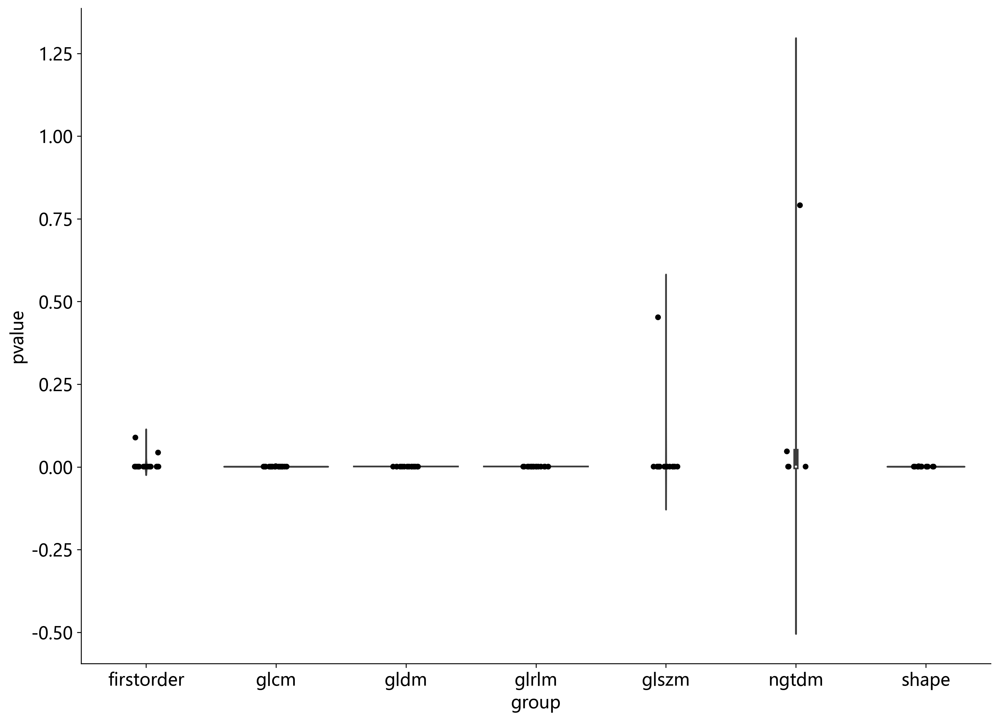

In [10]:
import matplotlib.pyplot as plt

def map2float(x):
    try:
        return float(str(x)[1:])
    except:
        return 1

stats[['pvalue']] = stats[['pvalue']].applymap(map2float)
stats[['group']] = stats[['feature_name']].applymap(lambda x: x.split('_')[1])
stats = stats[['feature_name', 'pvalue', 'group']]
g = sns.catplot(x="group", y="pvalue", data=stats, kind="violin")
g.fig.set_size_inches(15,10)
sns.stripplot(x="group", y="pvalue", data=stats, ax=g.ax, color='black')
plt.savefig(f'img/feature_stats.svg', bbox_inches = 'tight')

#### 调整pvalue进行筛选。

In [11]:
pvalue = 0.05
sel_feature = list(stats[stats['pvalue'] < pvalue]['feature_name']) + labels
data = data[sel_feature]
data

,original_firstorder_10Percentile,original_firstorder_90Percentile,original_firstorder_Energy,original_firstorder_Entropy,original_firstorder_InterquartileRange,original_firstorder_Maximum,original_firstorder_Mean,original_firstorder_MeanAbsoluteDeviation,original_firstorder_Median,original_firstorder_Minimum,...,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,original_shape_Sphericity,original_shape_SurfaceArea,original_shape_SurfaceVolumeRatio,original_shape_VoxelVolume,label
0,1.372,0.420,-0.272,-0.831,-1.230,0.447,0.914,-0.950,0.592,1.663,...,-0.507,-1.137,-0.561,-0.279,-1.058,0.685,-0.463,1.222,-0.280,0
1,-0.574,-1.079,-0.282,-0.535,0.069,-1.211,-1.056,-0.256,-1.149,0.090,...,-0.359,-0.762,-0.505,-0.265,-0.635,0.989,-0.424,0.429,-0.265,0
2,0.789,0.280,-0.182,-0.439,-0.497,-0.023,0.561,-0.594,0.492,0.680,...,0.078,0.100,0.161,-0.123,0.799,-1.450,0.019,-0.114,-0.122,0
3,-0.254,-0.435,-0.281,-0.092,0.172,-0.370,-0.629,-0.062,-0.981,0.440,...,-0.437,-0.531,-0.348,-0.268,-0.668,0.056,-0.417,0.953,-0.268,0
4,0.550,0.869,-0.257,-0.022,0.121,0.372,0.759,0.109,0.559,0.942,...,-0.325,-1.016,-0.469,-0.262,-0.761,0.815,-0.415,0.431,-0.263,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1392,-1.534,-0.175,-0.120,1.322,1.780,0.174,-1.204,1.474,-1.417,-1.439,...,0.169,1.132,0.491,-0.053,0.864,-1.015,0.113,-0.543,-0.052,1
1393,-2.145,-0.540,-0.127,1.109,2.050,-0.394,-2.149,1.882,-2.622,-1.373,...,-0.040,0.490,0.104,-0.148,0.390,-0.688,-0.099,-0.295,-0.148,1
1394,-1.329,-0.410,-0.206,1.198,1.368,0.026,-1.194,1.301,-1.316,-1.286,...,-0.282,-0.138,-0.168,-0.169,-0.163,0.830,-0.222,-0.647,-0.169,1
1395,0.574,0.385,-0.057,-0.086,-0.330,0.496,0.689,-0.354,0.759,0.593,...,4.716,1.104,4.465,4.160,1.696,-1.593,4.559,-1.759,4.222,1


### 相关系数

计算相关系数的方法有3种可供选择
1. pearson （皮尔逊相关系数）: standard correlation coefficient

2. kendall (肯德尔相关性系数) : Kendall Tau correlation coefficient

3. spearman (斯皮尔曼相关性系数): Spearman rank correlation

三种相关系数参考：https://blog.csdn.net/zmqsdu9001/article/details/82840332

In [ ]:
# 相关系数视频
onekey_show('传统组学任务|相关系数')

In [12]:
pearson_corr = data[[c for c in data.columns if c not in labels]].corr('pearson')
# kendall_corr = data[[c for c in data.columns if c not in labels]].corr('kendall')
# spearman_corr = data[[c for c in data.columns if c not in labels]].corr('spearman')

### 相关系数可视化

通过修改变量名，可以可视化不同相关系数下的相关矩阵。

**注意**：当特征特别多的时候（大于100），尽量不要可视化，否则运行时间会特别长。

In [ ]:
import seaborn as sns
from onekey_algo.custom.components.comp1 import draw_matrix
plt.figure(figsize=(50.0, 40.0))

# 选择可视化的相关系数
draw_matrix(pearson_corr, annot=True, cmap='YlGnBu', cbar=False)
plt.savefig(f'img/feature_corr.svg', bbox_inches = 'tight')

### 聚类分析

通过修改变量名，可以可视化不同相关系数下的相聚类分析矩阵。

注意：当特征特别多的时候（大于100），尽量不要可视化，否则运行时间会特别长。

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

pp = sns.clustermap(pearson_corr, linewidths=.5, figsize=(50.0, 40.0), cmap='YlGnBu')
plt.setp(pp.ax_heatmap.get_yticklabels(), rotation=0)
plt.savefig(f'img/feature_cluster.svg', bbox_inches = 'tight')

### 特征筛选 -- 相关系数

根据相关系数，对于相关性比较高的特征（一般文献取corr>0.9），两者保留其一。

```python
def select_feature(corr, threshold: float = 0.9, keep: int = 1, topn=10, verbose=False):
    """
    * corr, 相关系数矩阵。
    * threshold，筛选的相关系数的阈值，大于阈值的两者保留其一（可以根据keep修改，可以是其二...）。默认阈值为0.9
    * keep，可以选择大于相关系数，保留几个，默认只保留一个。
    * topn, 每次去掉多少重复特征。
    * verbose，是否打印日志
    """
```

In [ ]:
# 特征筛选视频
onekey_show('传统组学任务|特征筛选')

In [13]:
from onekey_algo.custom.components.comp1 import select_feature
sel_feature = select_feature(pearson_corr, threshold=0.9, topn=10, verbose=False)
sel_feature += labels
sel_feature

['original_firstorder_10Percentile',
 'original_firstorder_90Percentile',
 'original_firstorder_Energy',
 'original_firstorder_Maximum',
 'original_firstorder_Median',
 'original_firstorder_Minimum',
 'original_firstorder_RootMeanSquared',
 'original_firstorder_Skewness',
 'original_glcm_ClusterProminence',
 'original_glcm_ClusterShade',
 'original_glcm_Correlation',
 'original_glcm_DifferenceVariance',
 'original_glcm_Idm',
 'original_glcm_Idn',
 'original_glcm_Imc1',
 'original_glcm_InverseVariance',
 'original_glcm_MCC',
 'original_glcm_MaximumProbability',
 'original_gldm_DependenceNonUniformityNormalized',
 'original_gldm_DependenceVariance',
 'original_gldm_LargeDependenceLowGrayLevelEmphasis',
 'original_gldm_SmallDependenceHighGrayLevelEmphasis',
 'original_gldm_SmallDependenceLowGrayLevelEmphasis',
 'original_glrlm_GrayLevelNonUniformityNormalized',
 'original_glrlm_GrayLevelVariance',
 'original_glrlm_LongRunHighGrayLevelEmphasis',
 'original_glrlm_RunVariance',
 'original_gl

### 过滤特征

通过`sel_feature`过滤出筛选出来的特征。

In [14]:
sel_data = data[sel_feature]
sel_data.describe()

,original_firstorder_10Percentile,original_firstorder_90Percentile,original_firstorder_Energy,original_firstorder_Maximum,original_firstorder_Median,original_firstorder_Minimum,original_firstorder_RootMeanSquared,original_firstorder_Skewness,original_glcm_ClusterProminence,original_glcm_ClusterShade,...,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MinorAxisLength,original_shape_Sphericity,original_shape_SurfaceVolumeRatio,original_shape_VoxelVolume,label
count,1397.000,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,...,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1.397e+03,1397.000
mean,0.000,-2.034e-17,5.086e-18,3.815e-17,-6.103e-17,1.017e-17,-3.560e-17,7.121e-17,6.103e-17,-5.086e-18,...,1.424e-16,1.628e-16,-7.121e-17,-3.052e-17,-1.017e-17,-3.052e-16,3.255e-16,-2.848e-16,-3.052e-17,0.326
std,1.000,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,...,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,1.000e+00,0.469
min,-2.648,-3.869e+00,-2.878e-01,-3.140e+00,-3.124e+00,-3.296e+00,-1.774e+00,-3.830e+00,-3.801e-01,-5.762e+00,...,-2.720e+00,-1.716e+00,-9.448e-01,-1.423e+00,-8.423e-01,-1.404e+00,-4.183e+00,-2.116e+00,-2.969e-01,0.000
25%,-0.684,-6.309e-01,-2.687e-01,-6.171e-01,-6.466e-01,-7.180e-01,-7.124e-01,-5.856e-01,-3.277e-01,-3.027e-02,...,-6.370e-01,-6.109e-01,-4.776e-01,-7.079e-01,-4.439e-01,-6.451e-01,-5.720e-01,-7.066e-01,-2.605e-01,0.000
50%,-0.027,-2.113e-02,-2.326e-01,-4.818e-02,-1.053e-02,1.777e-01,-1.002e-01,9.287e-02,-2.555e-01,2.548e-01,...,3.059e-02,-2.159e-01,-1.848e-01,-2.387e-01,-1.791e-01,-2.350e-01,1.151e-01,-1.053e-01,-2.078e-01,0.000
75%,0.697,5.956e-01,-9.063e-02,4.960e-01,6.423e-01,7.238e-01,5.187e-01,6.497e-01,2.934e-02,3.369e-01,...,7.060e-01,3.801e-01,2.391e-01,4.201e-01,1.968e-01,3.800e-01,7.582e-01,6.014e-01,-5.428e-02,1.000
max,4.294,5.414e+00,1.949e+01,1.153e+01,4.375e+00,3.411e+00,6.216e+00,4.006e+00,3.079e+01,2.502e+01,...,2.577e+00,7.280e+00,2.763e+01,7.388e+00,1.896e+01,9.526e+00,1.966e+00,5.549e+00,2.047e+01,1.000


### 样本可视化

根据特征和label信息，将rad features降维到2维，看不同的label样本在二维空间的分布。

**注意**：由于特征空间维度极高，降维难免会有损失，所以二维的可视化仅供参考。

目前支持的:

| **降维方法** | **Method名称**                                                 |
| ------------ | ------------------------------------------------------------ |
| LLE      | Standard LLE, Modified LLE                                   |
| PCA      | t-SNE, NCA                                                      |
| SVD      | Truncated SVD                                              |
| Model Based      | Random projection, Isomap, MDS, Random Trees,Spectral       |

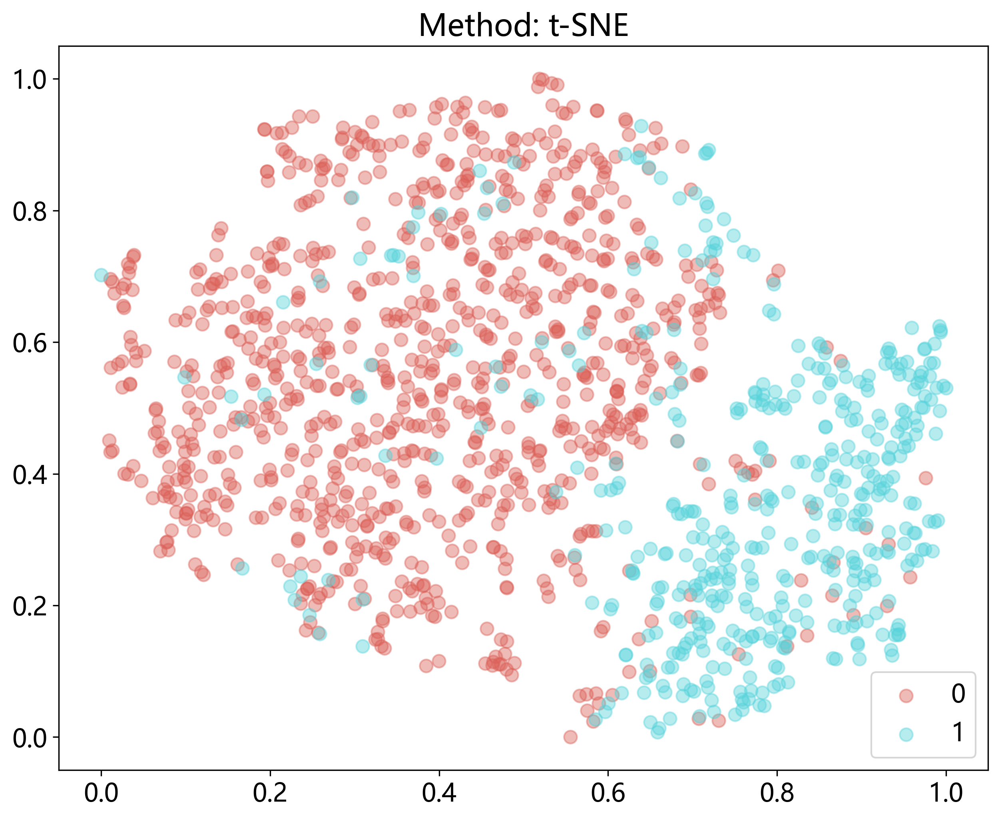

In [15]:
from onekey_algo.custom.components.comp1 import analysis_features
analysis_features(sel_data, data[labels[0]])

## 构建数据

将样本的训练数据X与监督信息y分离出来，并且对训练数据进行划分，一般的划分原则为80%-20%，

注意：如果使用get_bst_split,这个地方的划分不生效。稍微严谨点，是使用X_train以及y_train进行lasso。如果需要最严谨的做法，生成伪多中心数据，用多中心组件

In [16]:
import numpy as np
import onekey_algo.custom.components as okcomp

n_classes = 2
y_data = sel_data[labels]
X_data = sel_data.drop(labels, axis=1)
column_names = X_data.columns

# 如果使用get_bst_split,这个地方的划分不生效。
X_train, X_test, y_train, y_test = okcomp.comp1.split_dataset(X_data, y_data, test_size=0.2, random_state=0)
print(f"训练集样本数：{X_train.shape}, 验证集样本数：{X_test.shape}")

训练集样本数：(1117, 52), 验证集样本数：(280, 52)


### Lasso

初始化Lasso模型，alpha为惩罚系数。具体的参数文档可以参考：[文档](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html?highlight=lasso#sklearn.linear_model.Lasso)

### 交叉验证

不同Lambda下的，特征的的权重大小。
```python
def lasso_cv_coefs(X_data, y_data, points=50, column_names: List[str] = None, **kwargs):
    """

    Args:
        X_data: 训练数据
        y_data: 监督数据
        points: 打印多少个点。默认50
        column_names: 列名，默认为None，当选择的数据很多的时候，建议不要添加此参数
        **kwargs: 其他用于打印控制的参数。

    """
 ```

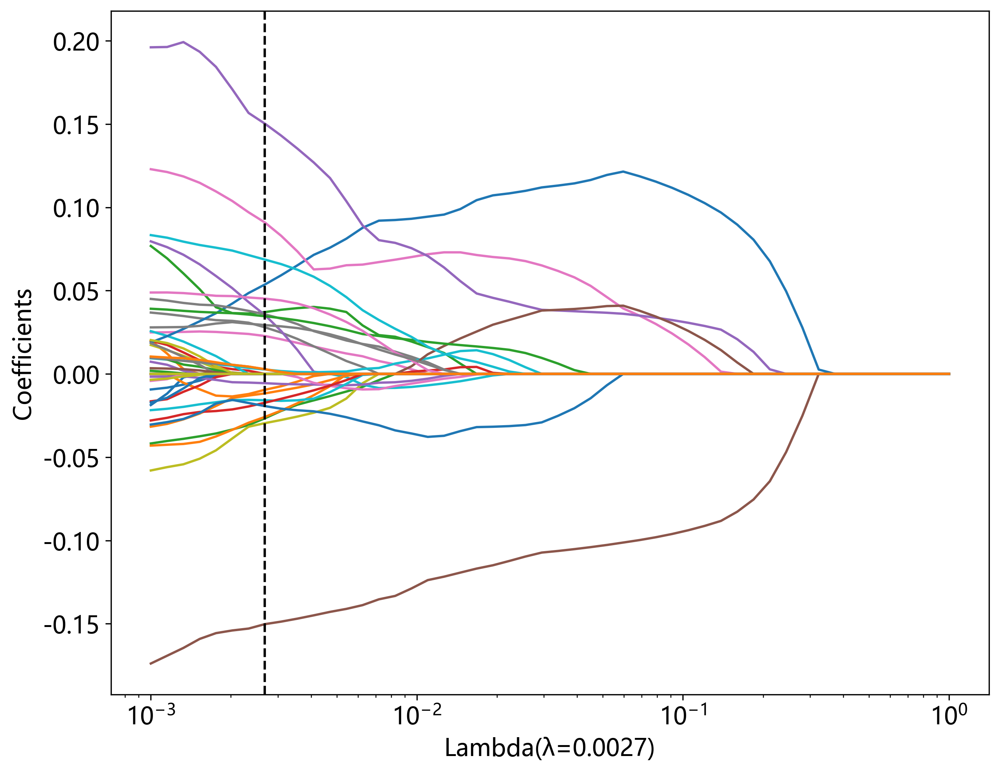

In [17]:
alpha = okcomp.comp1.lasso_cv_coefs(X_data, y_data, column_names=None)
plt.savefig(f'img/feature_lasso.svg', bbox_inches = 'tight')

### 模型效能

```python
def lasso_cv_efficiency(X_data, y_data, points=50, **kwargs):
    """

    Args:
        Xdata: 训练数据
        ydata: 测试数据
        points: 打印的数据密度
        **kwargs: 其他的图像样式
            # 数据点标记, fmt="o"
            # 数据点大小, ms=3
            # 数据点颜色, mfc="r"
            # 数据点边缘颜色, mec="r"
            # 误差棒颜色, ecolor="b"
            # 误差棒线宽, elinewidth=2
            # 误差棒边界线长度, capsize=2
            # 误差棒边界厚度, capthick=1
    Returns:
    """
 ```

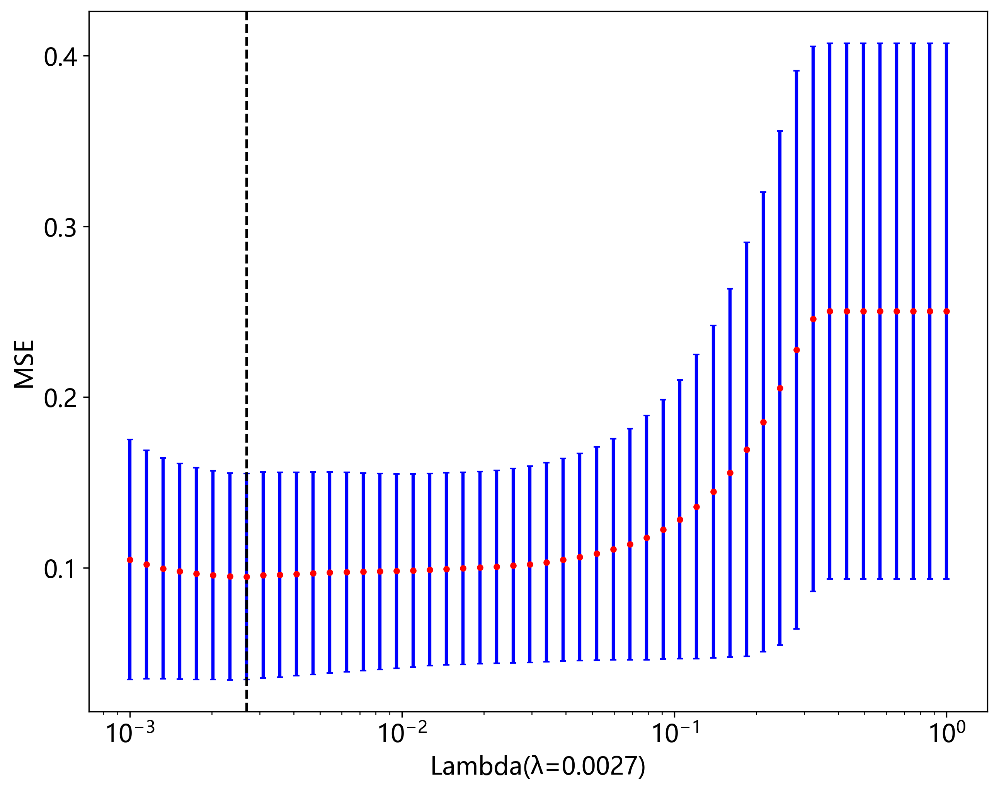

In [18]:
okcomp.comp1.lasso_cv_efficiency(X_data, y_data, points=50)
plt.savefig(f'img/feature_mse.svg', bbox_inches = 'tight')

### 惩罚系数

使用交叉验证的惩罚系数作为模型训练的基础。

In [19]:
from sklearn import linear_model

models = []
for label in labels:
    clf = linear_model.Lasso(alpha=alpha)
    clf.fit(X_data, y_data[label])
    models.append(clf)

### 特征筛选

筛选出其中coef > 0的特征。并且打印出相应的公式。

In [20]:
COEF_THRESHOLD = 1e-6 # 筛选的特征阈值
scores = []
selected_features = []
for label, model in zip(labels, models):
    feat_coef = [(feat_name, coef) for feat_name, coef in zip(column_names, model.coef_) 
                 if COEF_THRESHOLD is None or abs(coef) > COEF_THRESHOLD]
    selected_features.append([feat for feat, _ in feat_coef])
    formula = ' '.join([f"{coef:+.6f} * {feat_name}" for feat_name, coef in feat_coef])
    score = f"{label} = {model.intercept_} {'+' if formula[0] != '-' else ''} {formula}"
    scores.append(score)
    
print(scores[0])

label = 0.3264137437365784  -0.026747 * original_firstorder_Energy -0.150389 * original_firstorder_Minimum +0.022868 * original_firstorder_RootMeanSquared +0.028010 * original_firstorder_Skewness -0.029569 * original_glcm_ClusterProminence +0.053351 * original_glcm_Correlation -0.025989 * original_glcm_DifferenceVariance +0.037155 * original_glcm_Idm +0.035415 * original_glcm_Imc1 +0.090855 * original_glcm_MCC +0.035579 * original_glcm_MaximumProbability +0.002771 * original_gldm_DependenceVariance -0.009690 * original_gldm_SmallDependenceHighGrayLevelEmphasis +0.150525 * original_glrlm_GrayLevelVariance -0.011702 * original_glszm_LowGrayLevelZoneEmphasis -0.005593 * original_glszm_SmallAreaLowGrayLevelEmphasis +0.002781 * original_glszm_ZoneVariance -0.015777 * original_ngtdm_Coarseness +0.034630 * original_shape_Elongation -0.017326 * original_shape_Flatness +0.045142 * original_shape_Maximum2DDiameterSlice +0.029301 * original_shape_Maximum3DDiameter +0.068629 * original_shape_Spher

### 特征权重

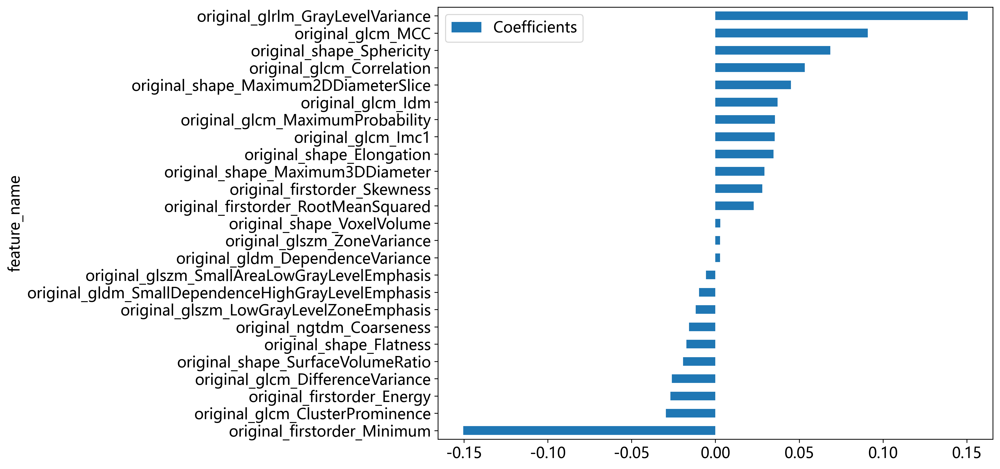

In [21]:
feat_coef = sorted(feat_coef, key=lambda x: x[1])
feat_coef_df = pd.DataFrame(feat_coef, columns=['feature_name', 'Coefficients'])
feat_coef_df.plot(x='feature_name', y='Coefficients', kind='barh')

plt.savefig(f'img/feature_weights.svg', bbox_inches = 'tight')

### 进一步筛选特征

使用Lasso筛选出来的Coefficients比较高的特征作为训练数据。

In [22]:
X_data = X_data[selected_features[0]]
X_data.columns

Index(['original_firstorder_Energy', 'original_firstorder_Minimum',
       'original_firstorder_RootMeanSquared', 'original_firstorder_Skewness',
       'original_glcm_ClusterProminence', 'original_glcm_Correlation',
       'original_glcm_DifferenceVariance', 'original_glcm_Idm',
       'original_glcm_Imc1', 'original_glcm_MCC',
       'original_glcm_MaximumProbability', 'original_gldm_DependenceVariance',
       'original_gldm_SmallDependenceHighGrayLevelEmphasis',
       'original_glrlm_GrayLevelVariance',
       'original_glszm_LowGrayLevelZoneEmphasis',
       'original_glszm_SmallAreaLowGrayLevelEmphasis',
       'original_glszm_ZoneVariance', 'original_ngtdm_Coarseness',
       'original_shape_Elongation', 'original_shape_Flatness',
       'original_shape_Maximum2DDiameterSlice',
       'original_shape_Maximum3DDiameter', 'original_shape_Sphericity',
       'original_shape_SurfaceVolumeRatio', 'original_shape_VoxelVolume'],
      dtype='object')

## 模型筛选

根据筛选出来的数据，做模型的初步选择。当前主要使用到的是Onekey中的

1. SVM，支持向量机，引用参考。
2. KNN，K紧邻，引用参考。
3. Decision Tree，决策树，引用参考。
4. Random Forests, 随机森林，引用参考。
5. XGBoost, bosting方法。引用参考。
6. LightGBM, bosting方法，引用参考。

In [23]:
model_names = ['SVM', 'KNN', 'RandomForest', 'ExtraTrees', 'XGBoost', 'LightGBM', 'NaiveBayes', 'AdaBoost', 'GradientBoosting', 'LR', 'MLP']
models = okcomp.comp1.create_clf_model(model_names)
model_names = list(models.keys())

### 交叉验证

`n_trails`指定随机次数，每次采用的是80%训练，随机20%进行测试，找到最好的模型，以及对应的最好的数据划分。


```python
def get_bst_split(X_data: pd.DataFrame, y_data: pd.DataFrame,
            models: dict, test_size=0.2, metric_fn=accuracy_score, n_trails=10,
            cv: bool = False, shuffle: bool = False, metric_cut_off: float = None, random_state=None):
    """
    寻找数据集中最好的数据划分。
    Args:
        X_data: 训练数据
        y_data: 监督数据
        models: 模型名称，Dict类型、
        test_size: 测试集比例，只有当cv=False时生效
        metric_fn: 评价模型好坏的函数，默认准确率，可选roc_auc_score。
        n_trails: 尝试多少次寻找最佳数据集划分。
        cv: 是否是交叉验证，默认是False，当为True时，n_trails为交叉验证的n_fold
        shuffle: 是否进行随机打乱
        metric_cut_off: 当metric_fn的值达到多少时进行截断。
        random_state: 随机种子

    Returns: {'max_idx': max_idx, "max_model": max_model, "max_metric": max_metric, "results": results}

    """
```

**注意：这里采用了【挑数据】，如果想要严谨，请修改`n_trails=1`。**

[2023-12-03 22:31:52 - comp1.py: 464]	WARNING	当cv=True的时候，采用的是交叉验证的模式，此时test_size的参数是不生效的，我们将忽略这个test_size设置。如果需要手动指定测试集比例，请修改cv=False。


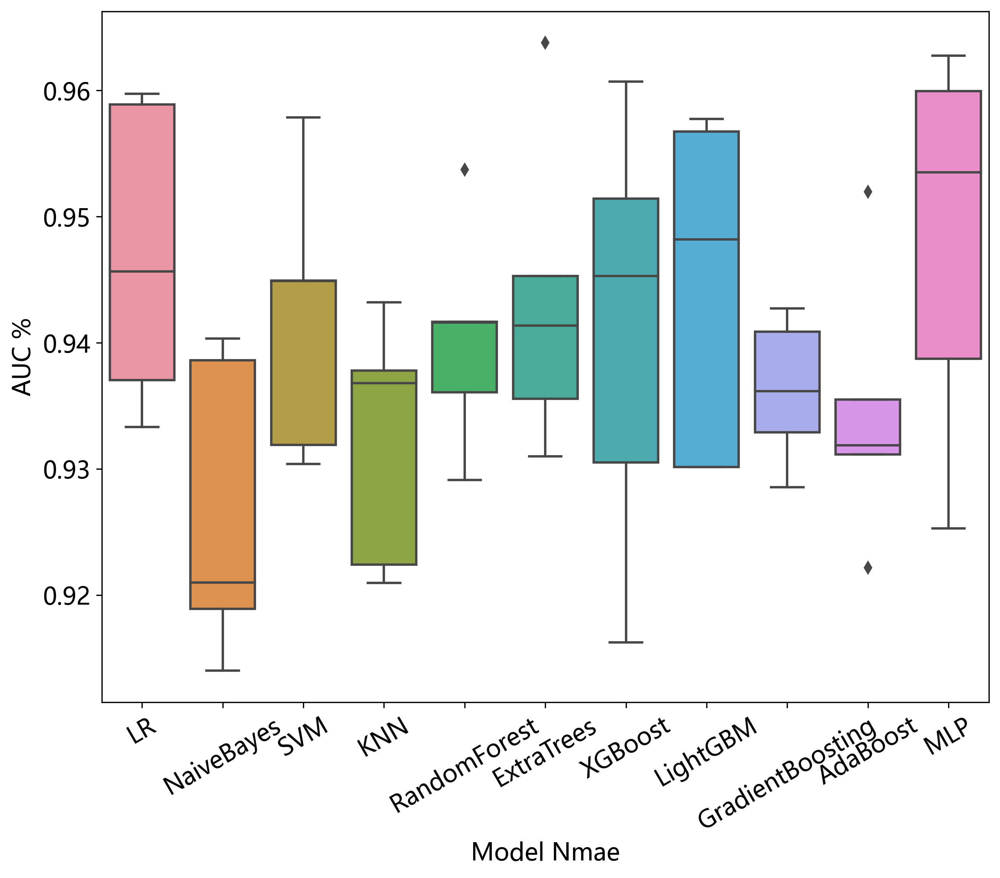

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import accuracy_score, roc_auc_score

# 随机使用n_trails次数据划分，找到最好的一次划分方法，并且保存在results中。
results = okcomp.comp1.get_bst_split(X_data, y_data, models, test_size=0.2, metric_fn=roc_auc_score, n_trails=5, cv=True, random_state=0)
_, (X_train_sel, X_test_sel, y_train_sel, y_test_sel) = results['results'][results['max_idx']]
trails, _ = zip(*results['results'])
cv_results = pd.DataFrame(trails, columns=model_names)
# 可视化每个模型在不同的数据划分中的效果。
sns.boxplot(data=cv_results)
plt.ylabel('AUC %')
plt.xlabel('Model Nmae')
plt.xticks(rotation=30)
plt.savefig(f'img/model_cv.svg', bbox_inches = 'tight')

## 模型筛选

使用最好的数据划分，进行后续的模型研究。

**注意**: 一般情况下论文使用的是随机划分的数据，但也有些论文使用【刻意】筛选的数据划分。

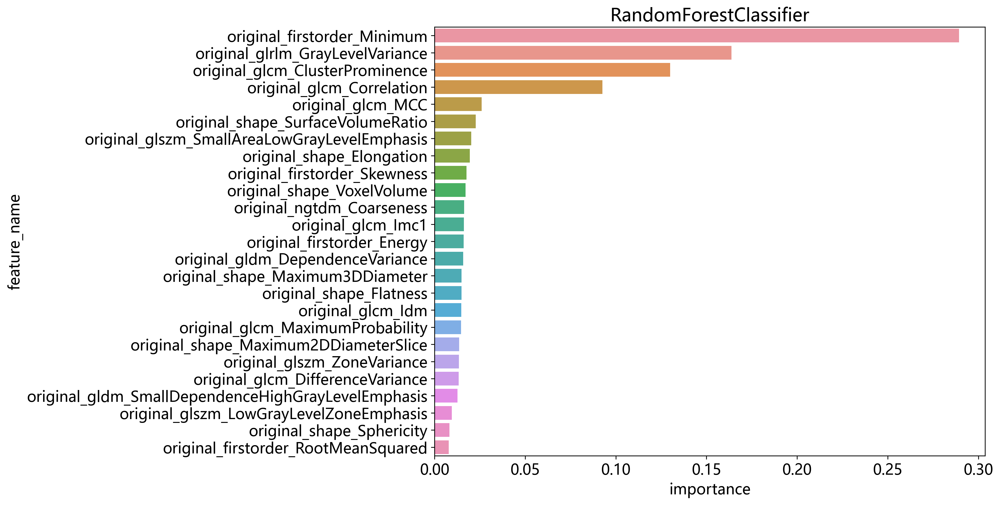

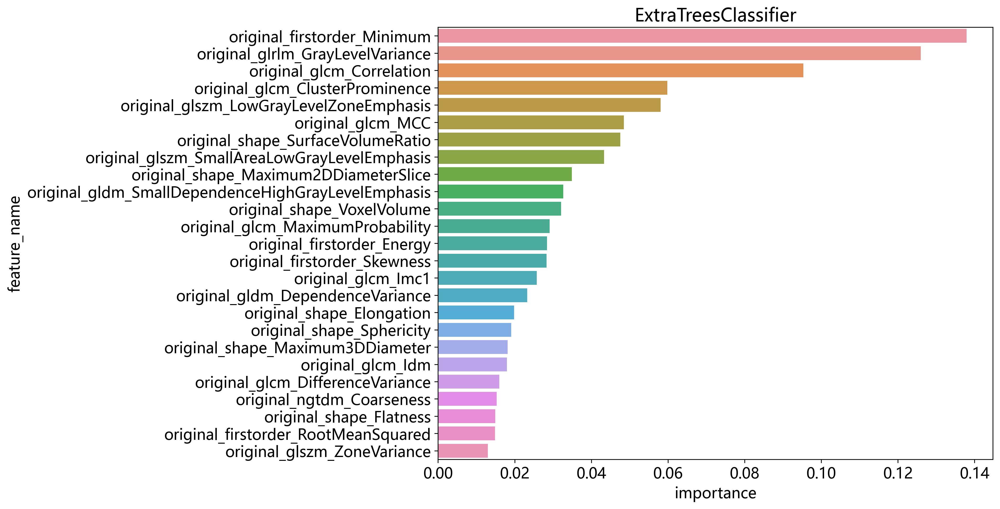

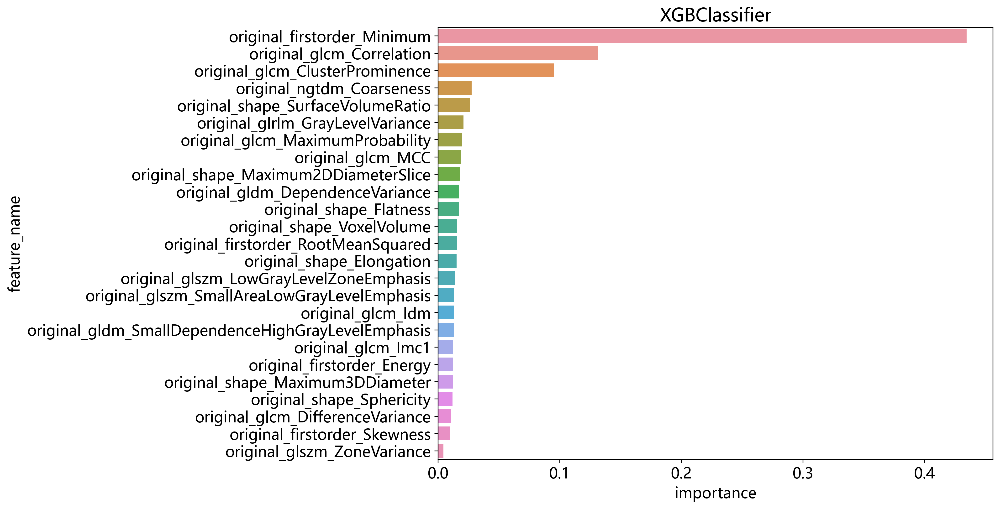

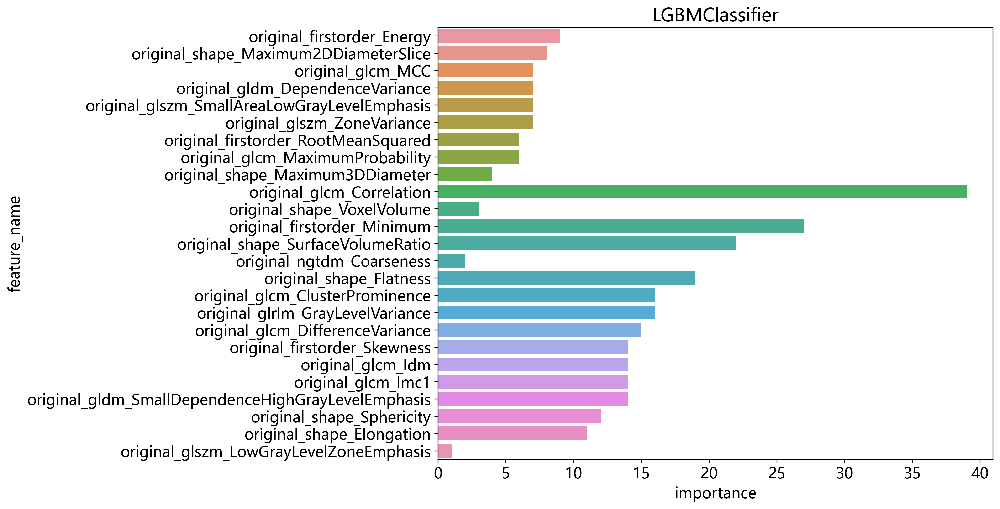

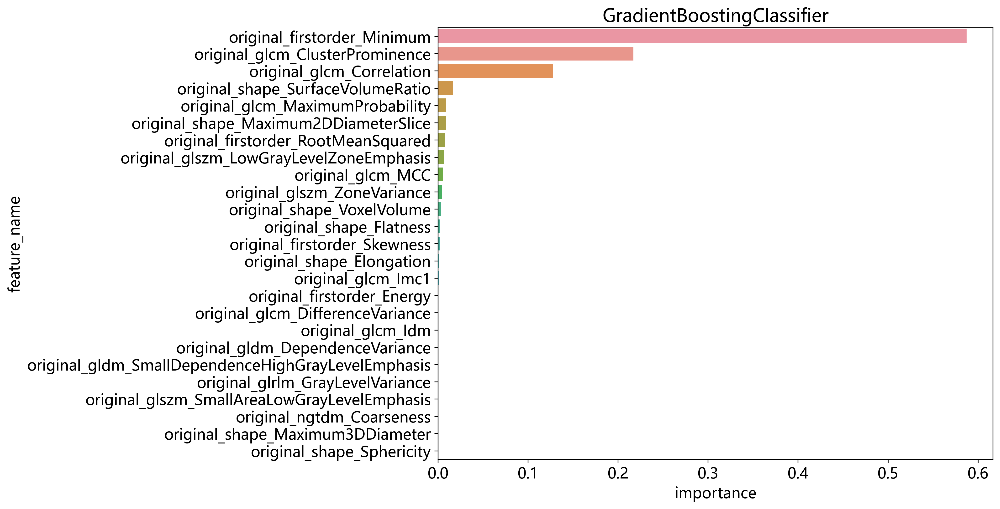

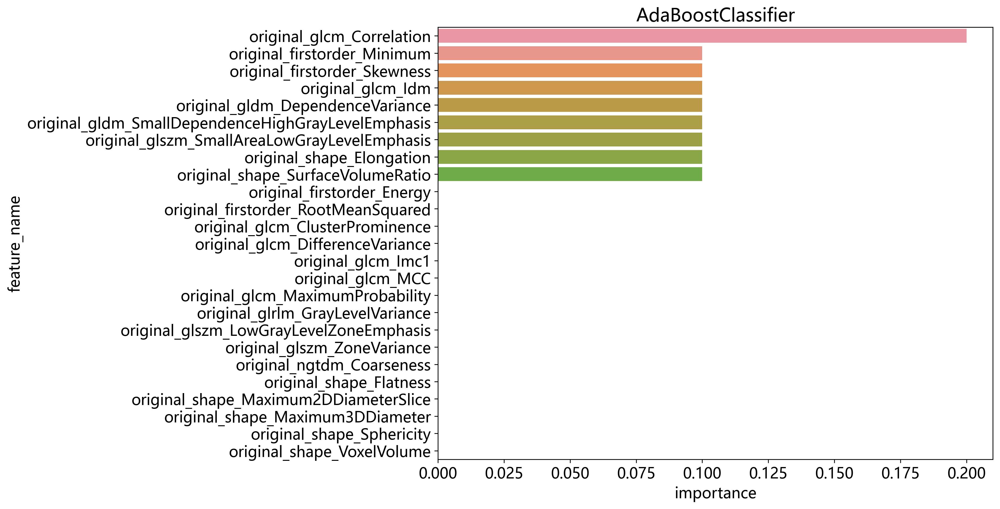

In [25]:
import joblib
from onekey_algo.custom.components.comp1 import plot_feature_importance
targets = []
os.makedirs('models', exist_ok=True)
for l in labels:
    new_models = list(okcomp.comp1.create_clf_model(model_names).values())
    for mn, m in zip(model_names, new_models):
        m.fit(X_train_sel, y_train_sel[l])
        # 保存训练的模型
        joblib.dump(m, f'models/{mn}_{l}.pkl') 
        # 输出模型特征重要性，只针对高级树模型有用
        plot_feature_importance(m, selected_features[0], save_dir='img')
    targets.append(new_models)

## 预测结果

* predictions，二维数据，每个label对应的每个模型的预测结果。
* pred_scores，二维数据，每个label对应的每个模型的预测概率值。

In [26]:
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder
from onekey_algo.custom.components.delong import calc_95_CI
from onekey_algo.custom.components.metrics import analysis_pred_binary

predictions = [[(model.predict(X_train_sel), model.predict(X_test_sel)) 
                for model in target] for label, target in zip(labels, targets)]
pred_scores = [[(model.predict_proba(X_train_sel), model.predict_proba(X_test_sel)) 
                for model in target] for label, target in zip(labels, targets)]

metric = []
pred_sel_idx = []
for label, prediction, scores in zip(labels, predictions, pred_scores):
    pred_sel_idx_label = []
    for mname, (train_pred, test_pred), (train_score, test_score) in zip(model_names, prediction, scores):
        # 计算训练集指数
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_train_sel[label], 
                                                                                              train_score[:, 1])
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, f"{label}-train"))
                 
        # 计算验证集指标
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_test_sel[label], 
                                                                                              test_score[:, 1])
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, f"{label}-test"))
        # 计算thres对应的sel idx
        pred_sel_idx_label.append(np.logical_or(test_score[:, 0] >= thres, test_score[:, 1] >= thres))
    
    pred_sel_idx.append(pred_sel_idx_label)
metric = pd.DataFrame(metric, index=None, columns=['model_name', 'Accuracy', 'AUC', '95% CI',
                                                   'Sensitivity', 'Specificity', 
                                                   'PPV', 'NPV', 'Precision', 'Recall', 'F1',
                                                   'Threshold', 'Task'])
metric

,model_name,Accuracy,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Threshold,Task
0,LR,0.926,0.952,0.9367 - 0.9672,0.868,0.954,0.901,0.937,0.901,0.868,0.884,4.069e-01,label-train
1,LR,0.928,0.960,0.9306 - 0.9888,0.868,0.957,0.908,0.937,0.908,0.868,0.888,3.485e-01,label-test
2,NaiveBayes,0.887,0.925,0.9065 - 0.9428,0.866,0.898,0.804,0.932,0.804,0.866,0.834,2.768e-04,label-train
3,NaiveBayes,0.875,0.940,0.9077 - 0.9730,0.923,0.851,0.750,0.958,0.750,0.923,0.828,7.573e-06,label-test
4,SVM,0.943,0.952,0.9359 - 0.9688,0.874,0.976,0.947,0.941,0.947,0.874,0.909,5.155e-01,label-train
5,SVM,0.921,0.958,0.9297 - 0.9860,0.879,0.941,0.879,0.941,0.879,0.879,0.879,2.505e-01,label-test
6,KNN,0.932,0.978,0.9720 - 0.9845,0.868,0.963,0.919,0.938,0.919,0.868,0.893,4.000e-01,label-train
7,KNN,0.918,0.943,0.9121 - 0.9743,0.813,0.968,0.925,0.915,0.925,0.813,0.865,4.000e-01,label-test
8,RandomForest,0.993,1.000,0.9995 - 1.0000,0.978,1.000,1.000,0.989,1.000,0.978,0.989,5.000e-01,label-train
9,RandomForest,0.914,0.954,0.9276 - 0.9799,0.780,0.979,0.947,0.902,0.947,0.780,0.855,6.000e-01,label-test


### 绘制曲线

绘制的不同模型的准确率柱状图和折线图曲线。

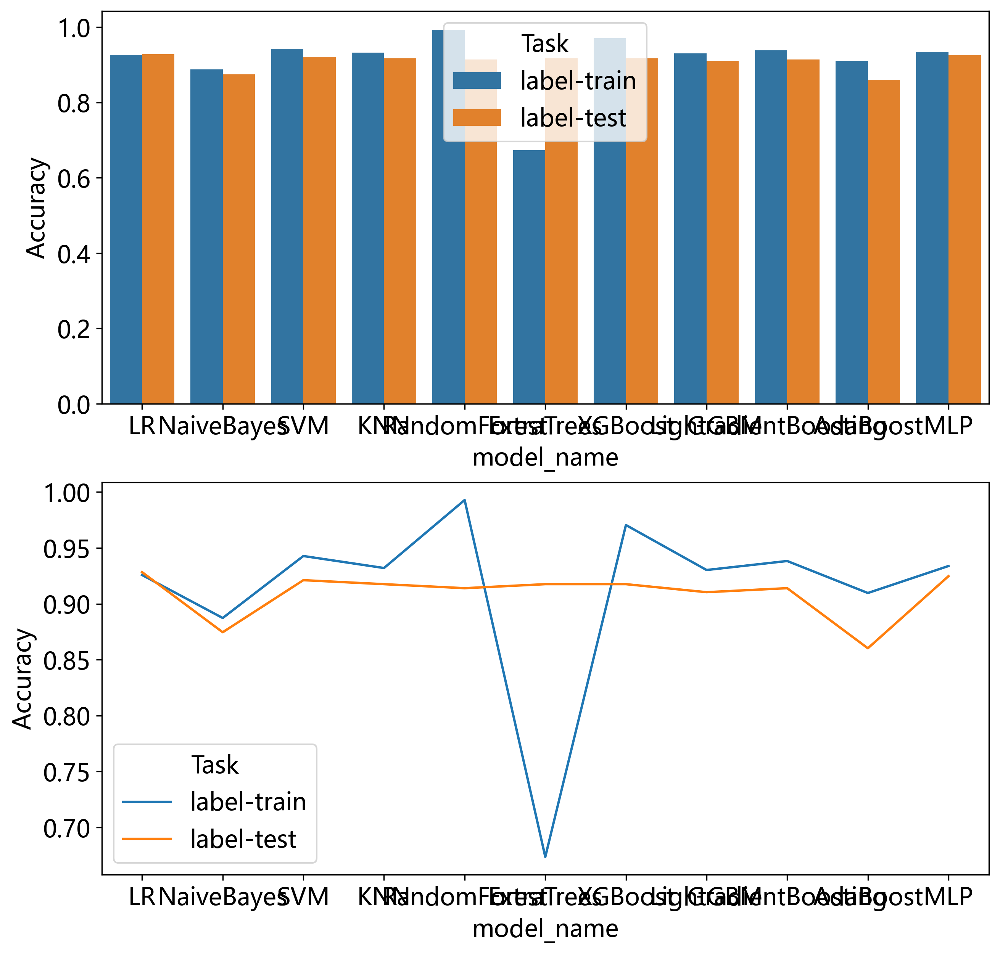

In [27]:
import seaborn as sns

plt.figure(figsize=(10, 10))
plt.subplot(211)
sns.barplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.subplot(212)
sns.lineplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.savefig(f'img/model_acc.svg', bbox_inches = 'tight')

### 绘制ROC曲线
确定最好的模型，并且绘制曲线。

```python
def draw_roc(y_test, y_score, title='ROC', labels=None):
```

`sel_model = ['SVM', 'KNN']`参数为想要绘制的模型对应的参数。

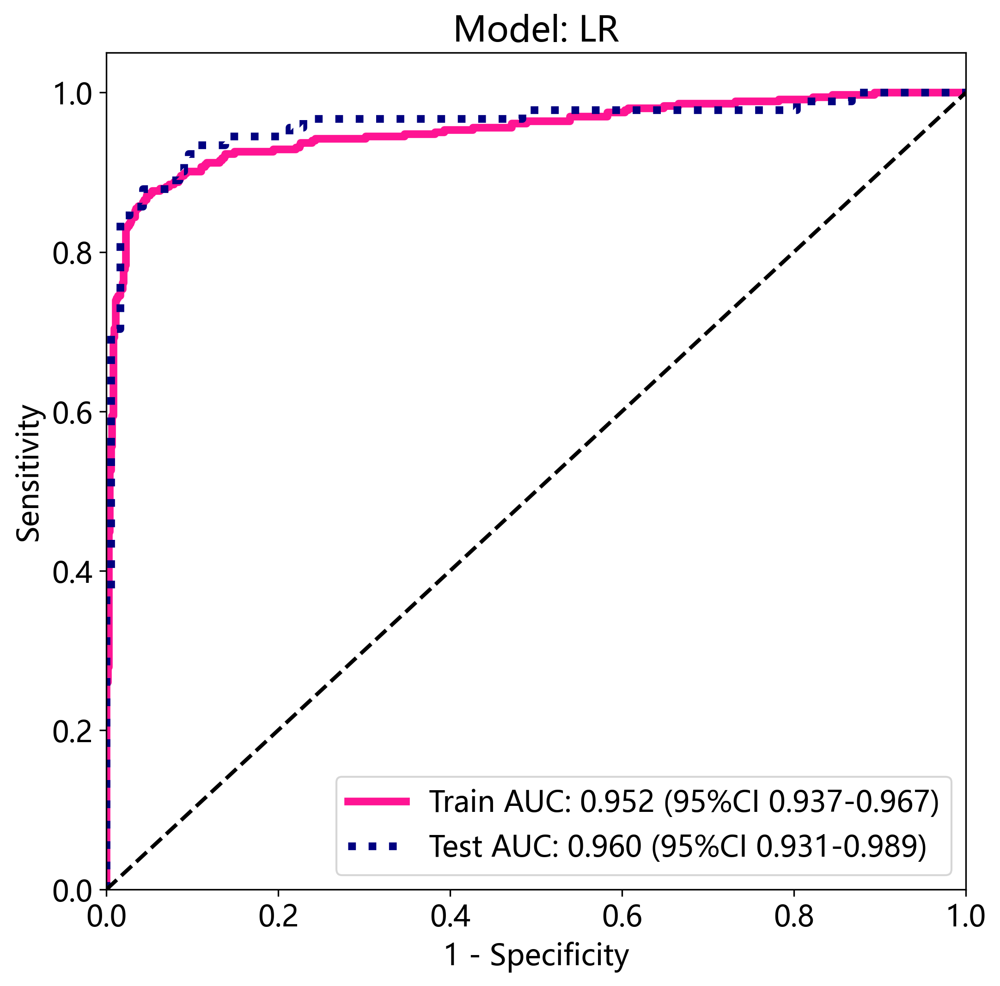

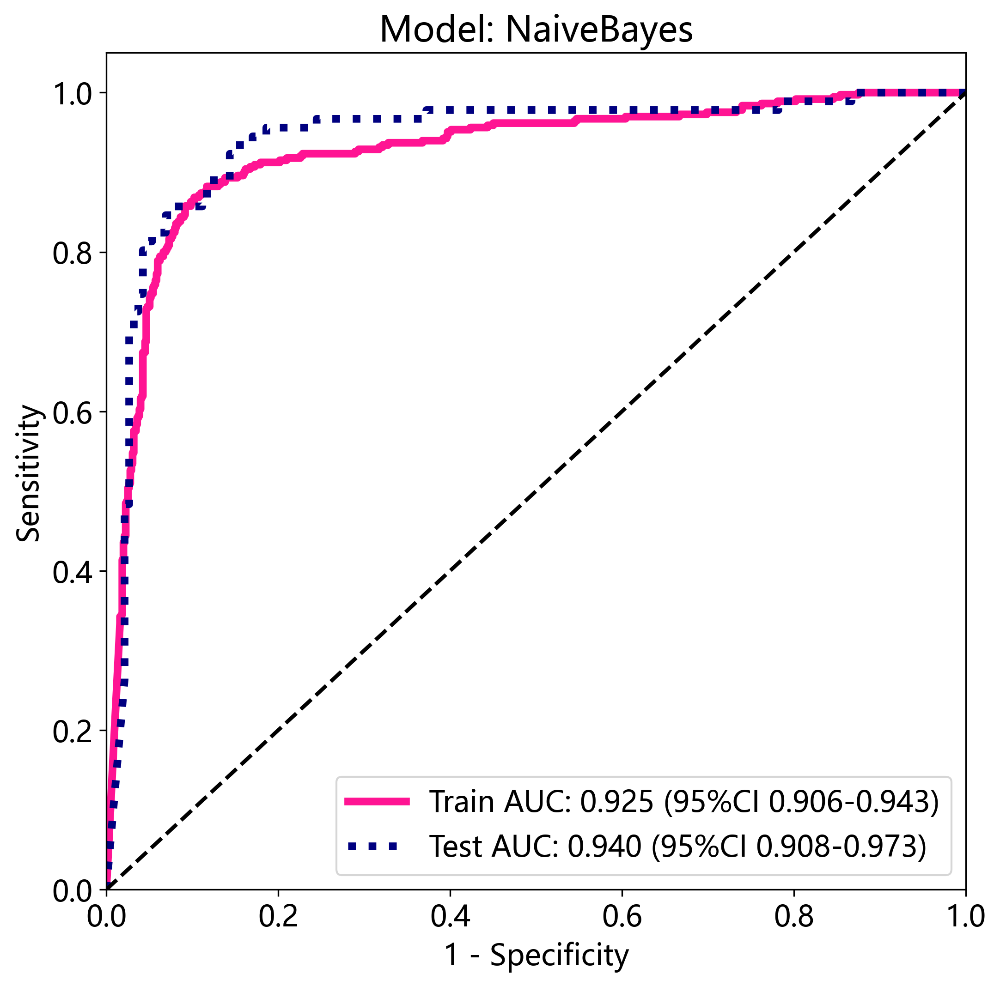

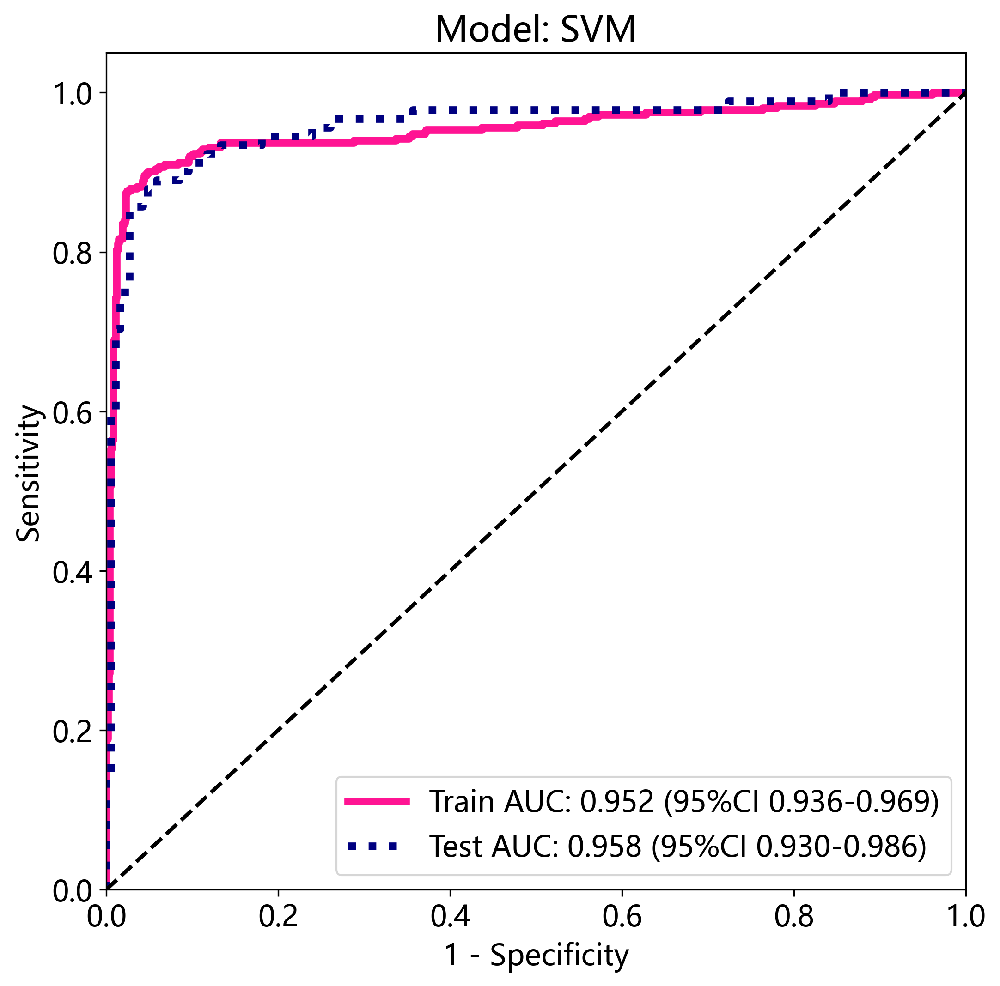

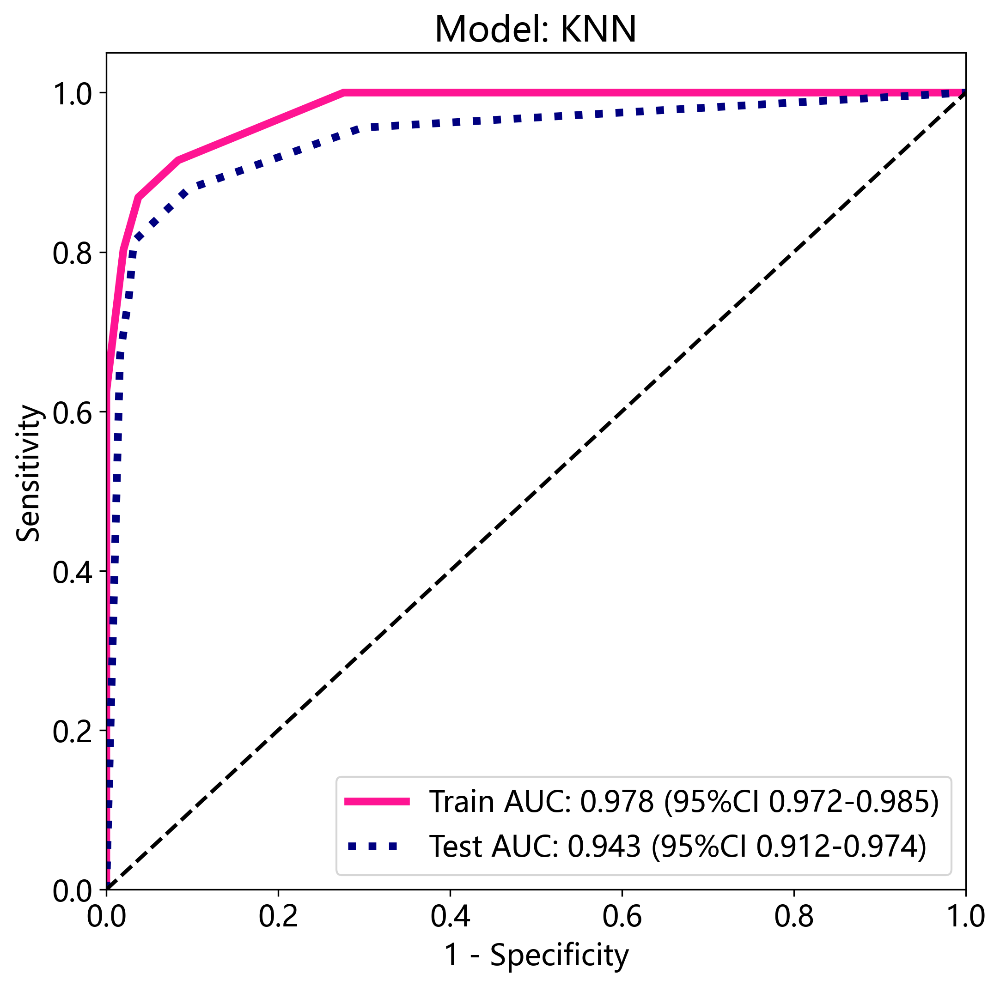

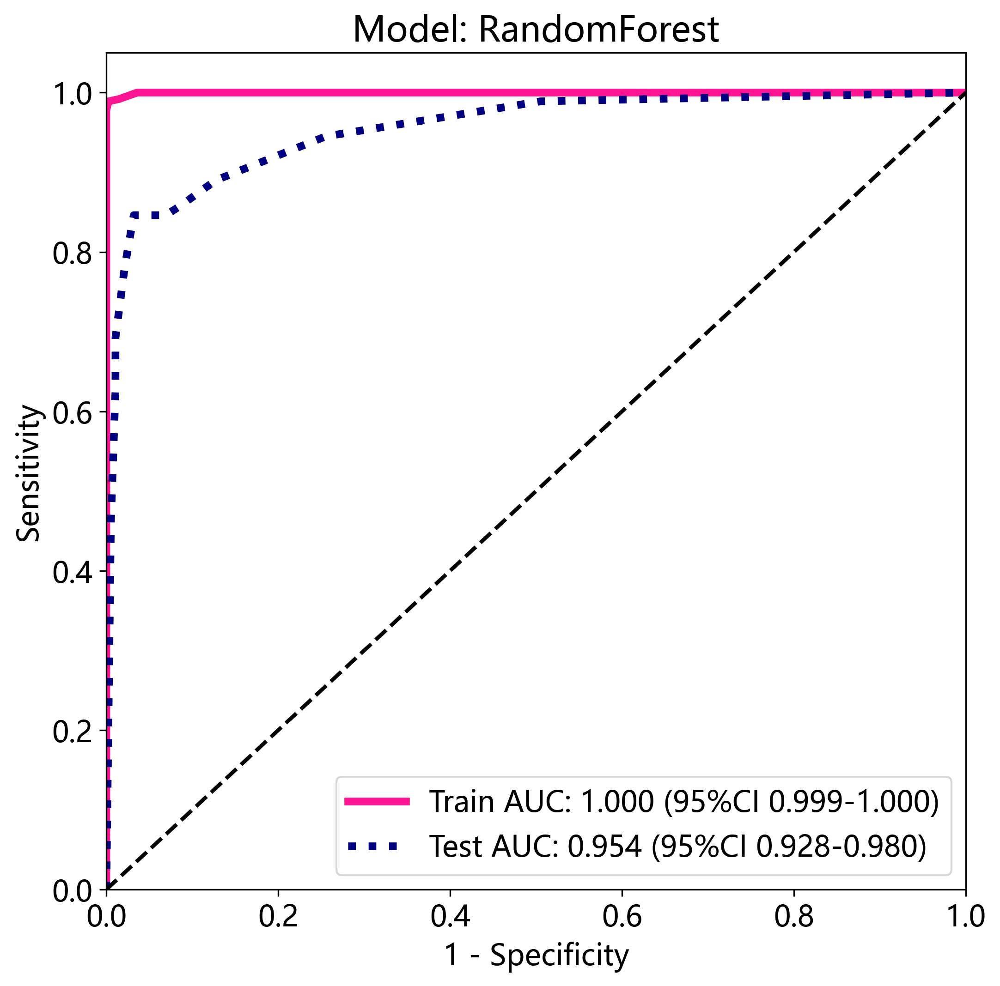

...

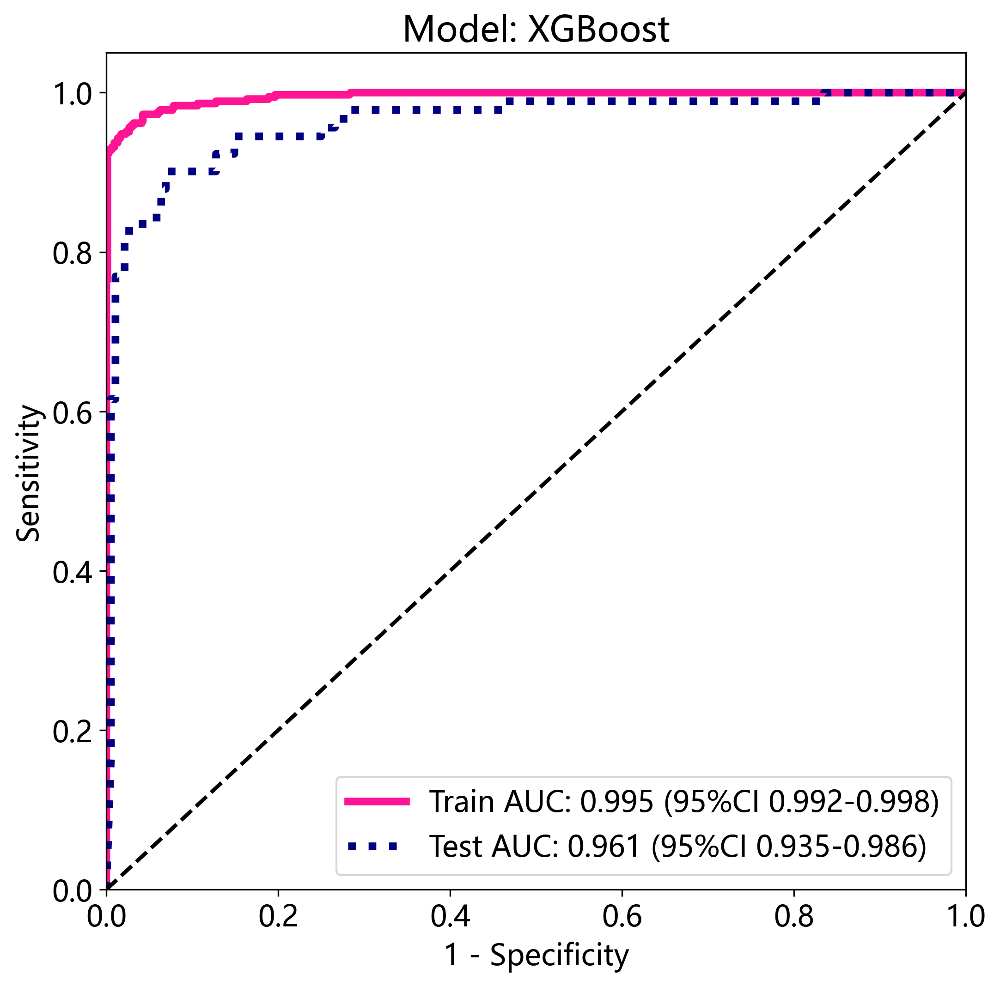

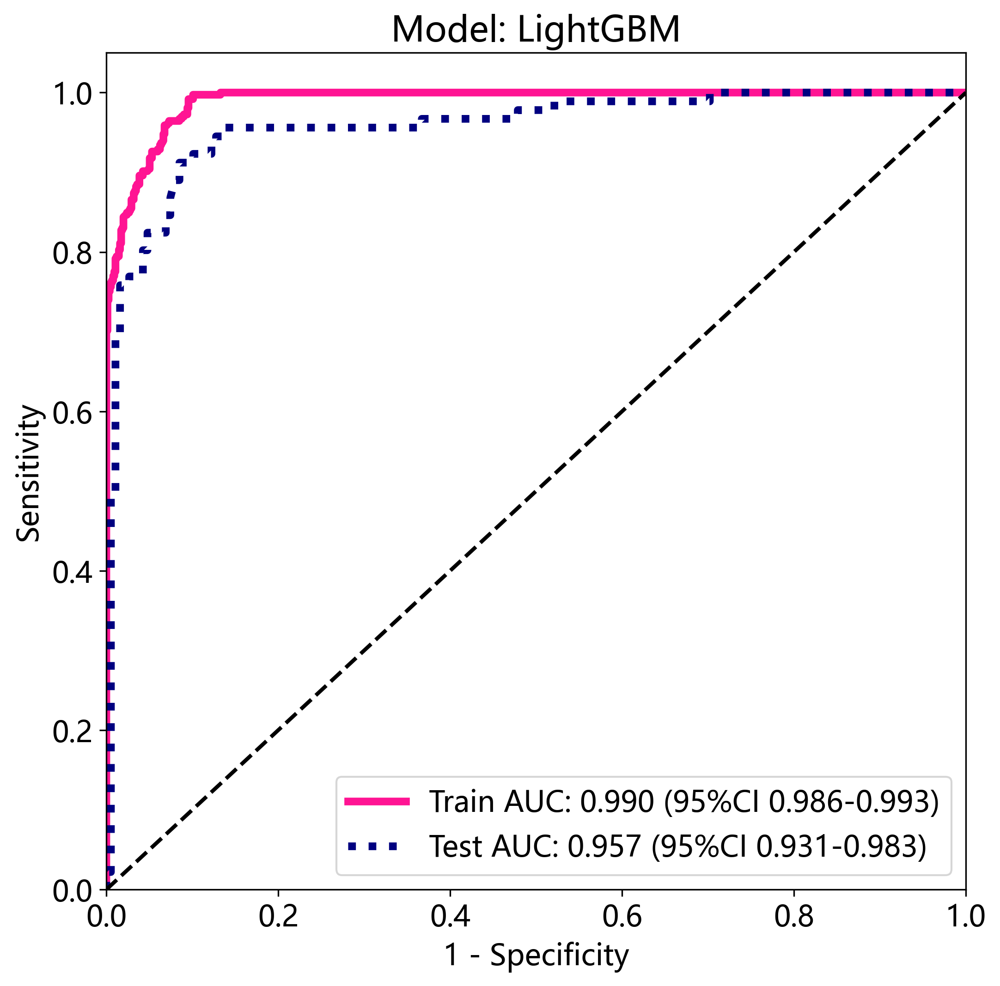

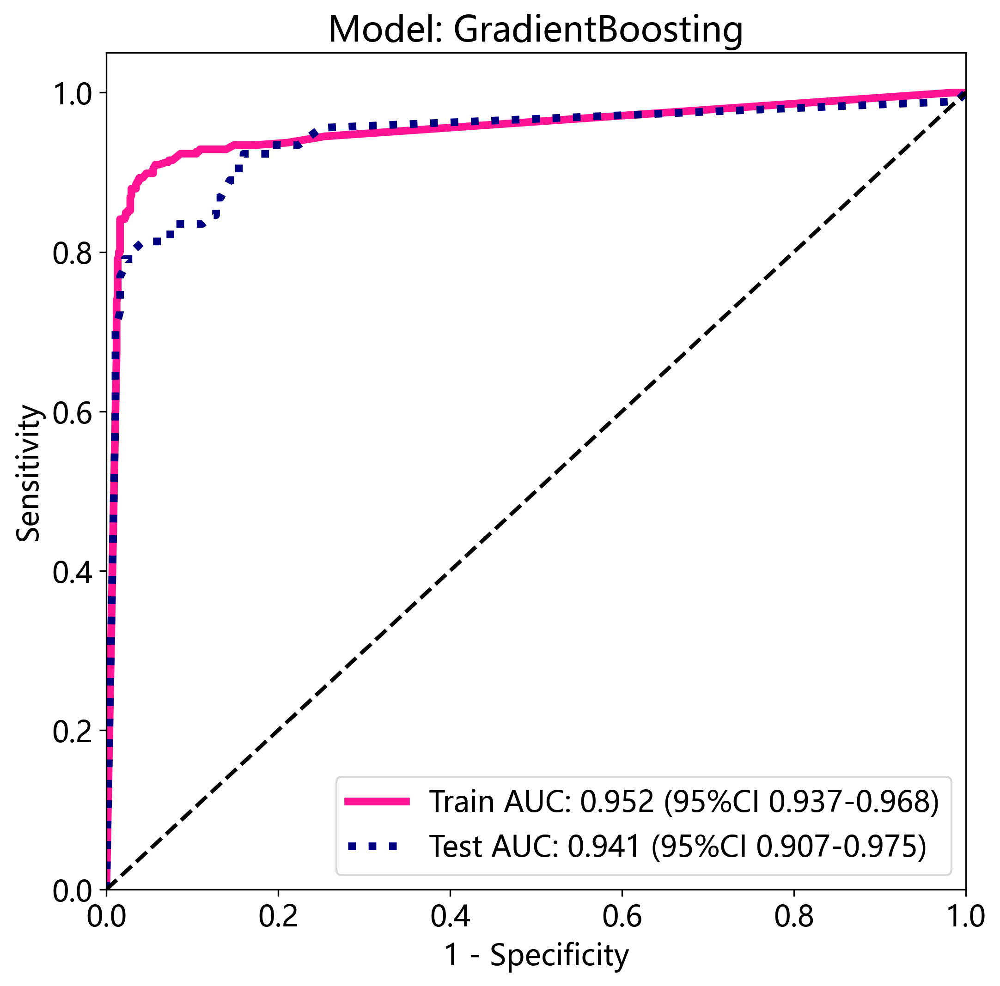

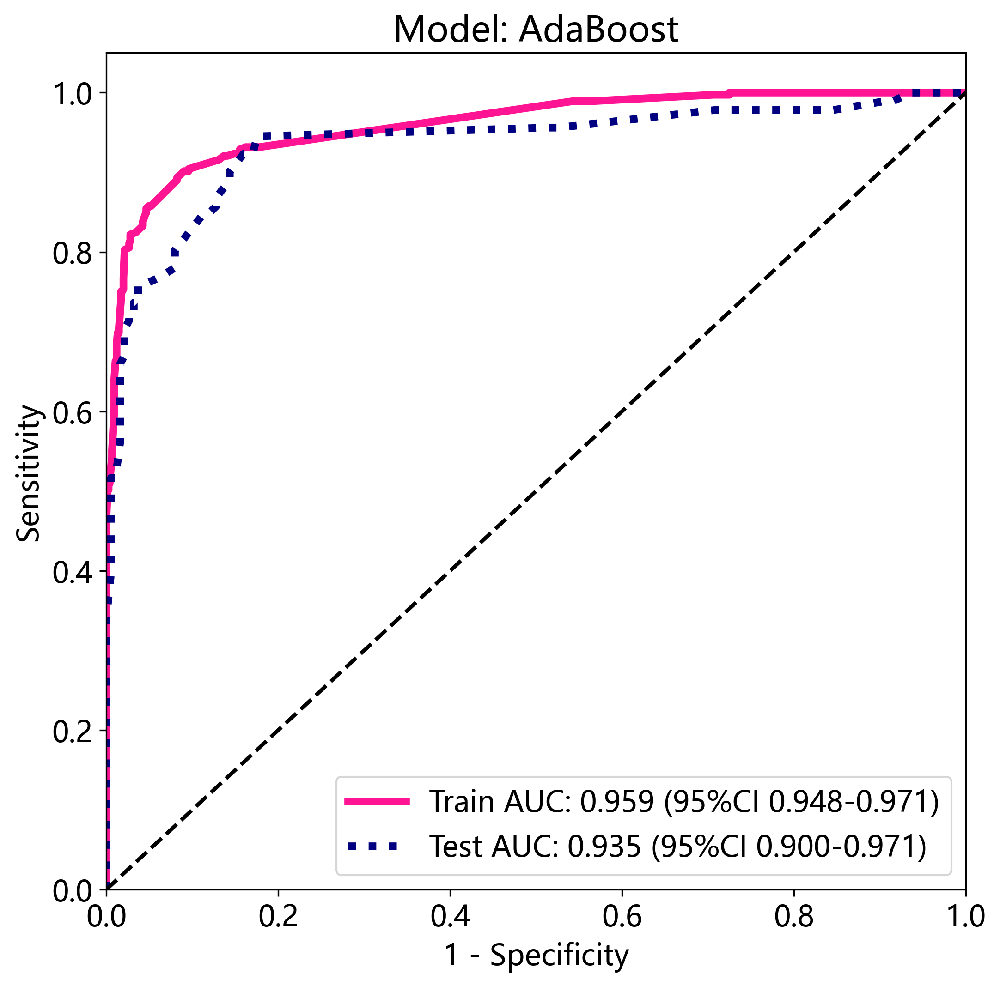

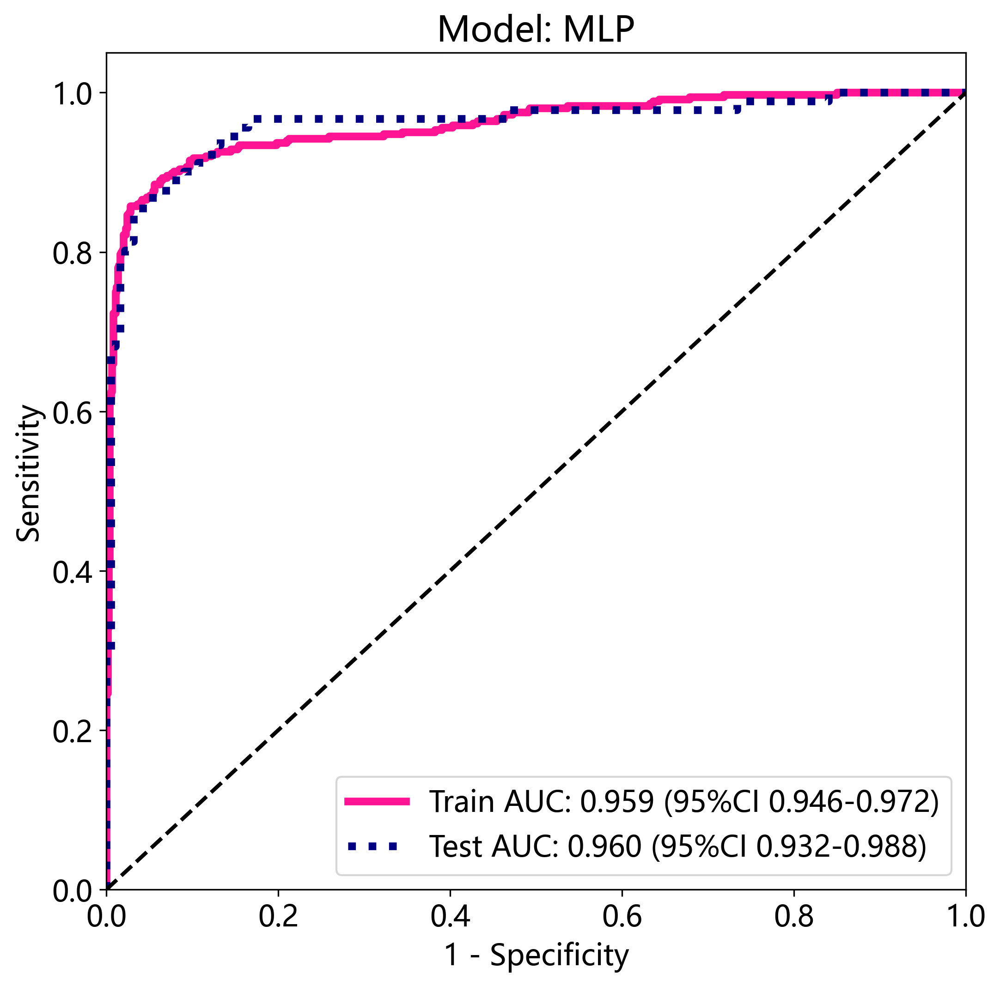

In [28]:
sel_model = model_names

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
    
        # Plot all ROC curves
        plt.figure(figsize=(8, 8))
        for pred_score, label in zip(pred_scores, labels):
            okcomp.comp1.draw_roc([np.array(y_train_sel[label]), np.array(y_test_sel[label])], 
                                  pred_score[sel_model_idx], 
                                  labels=['Train', 'Test'], title=f"Model: {sm}")
            plt.savefig(f'img/model_{sm}_roc.svg', bbox_inches = 'tight')

#### 汇总所有模型

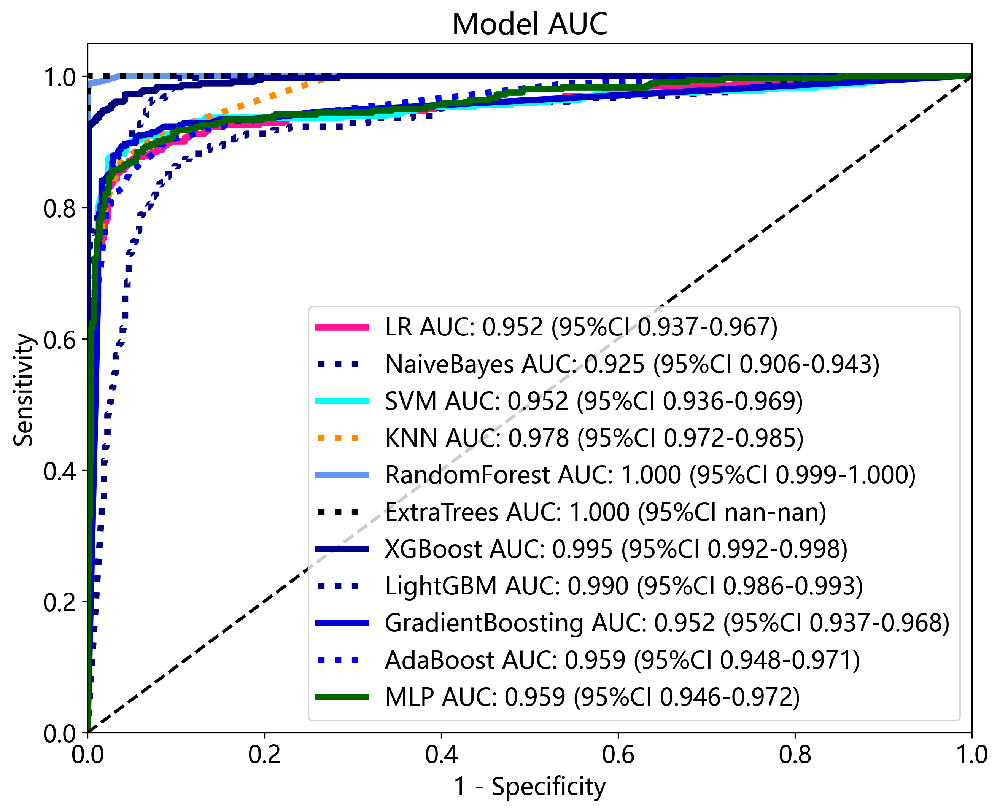

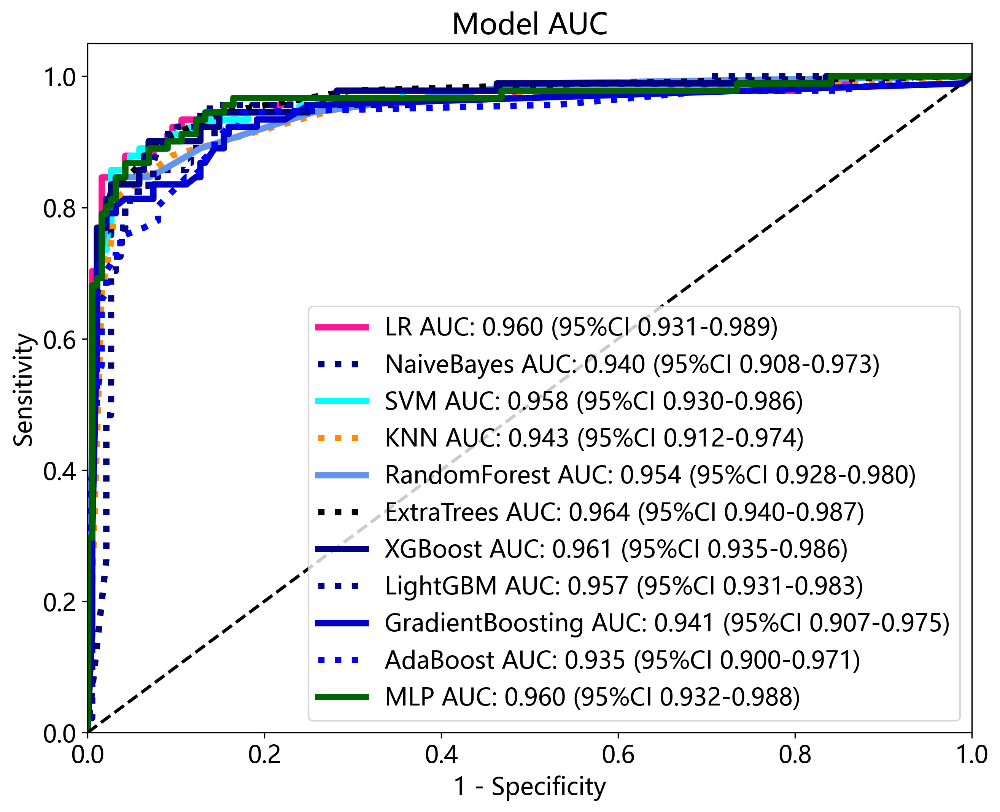

In [29]:
sel_model = model_names

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            pred_test_scores.append(pred_score[sel_model_idx][0])
    okcomp.comp1.draw_roc([np.array(y_train_sel[label])] * len(pred_test_scores), 
                          pred_test_scores, 
                          labels=sel_model, title=f"Model AUC")
    plt.savefig(f'img/model_roc_train.svg', bbox_inches = 'tight')
    plt.show()

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            pred_test_scores.append(pred_score[sel_model_idx][1])
    okcomp.comp1.draw_roc([np.array(y_test_sel[label])] * len(pred_test_scores), 
                          pred_test_scores, 
                          labels=sel_model, title=f"Model AUC")
    plt.savefig(f'img/model_roc_test.svg', bbox_inches = 'tight')

### DCA 决策曲线

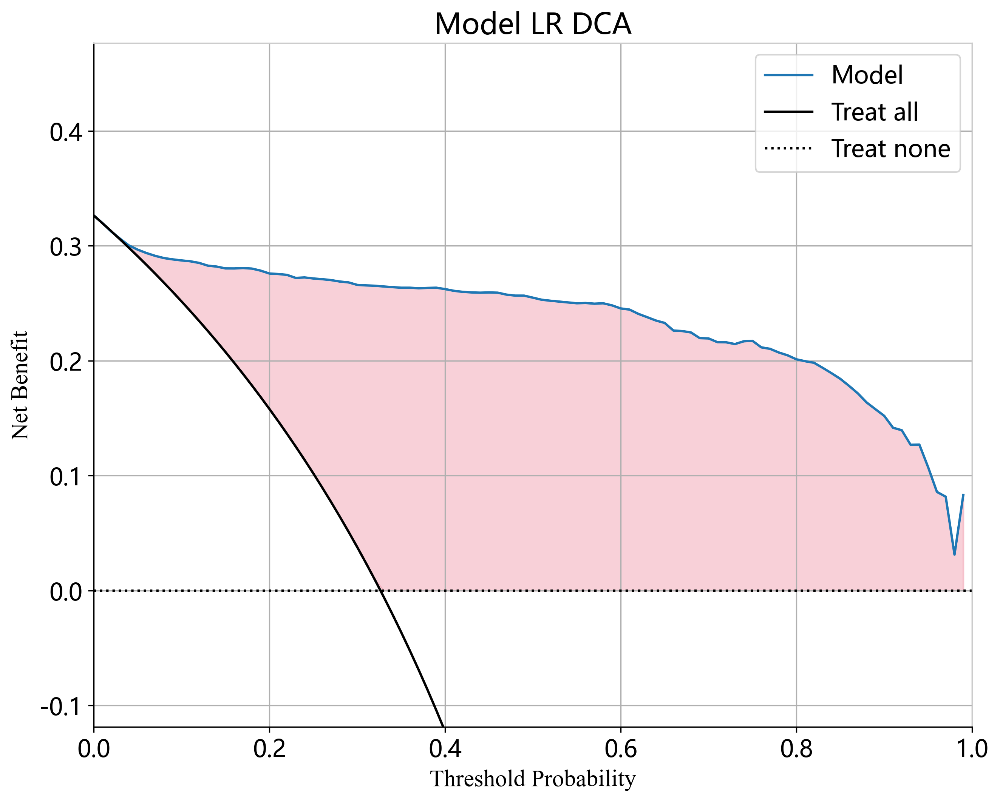

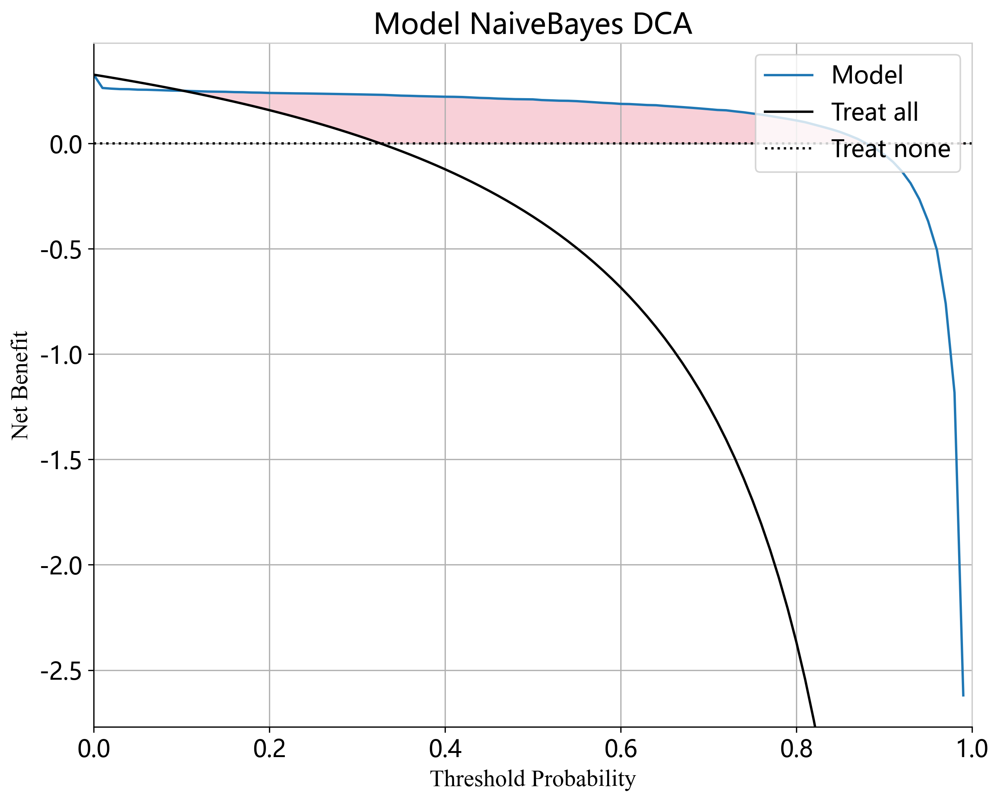

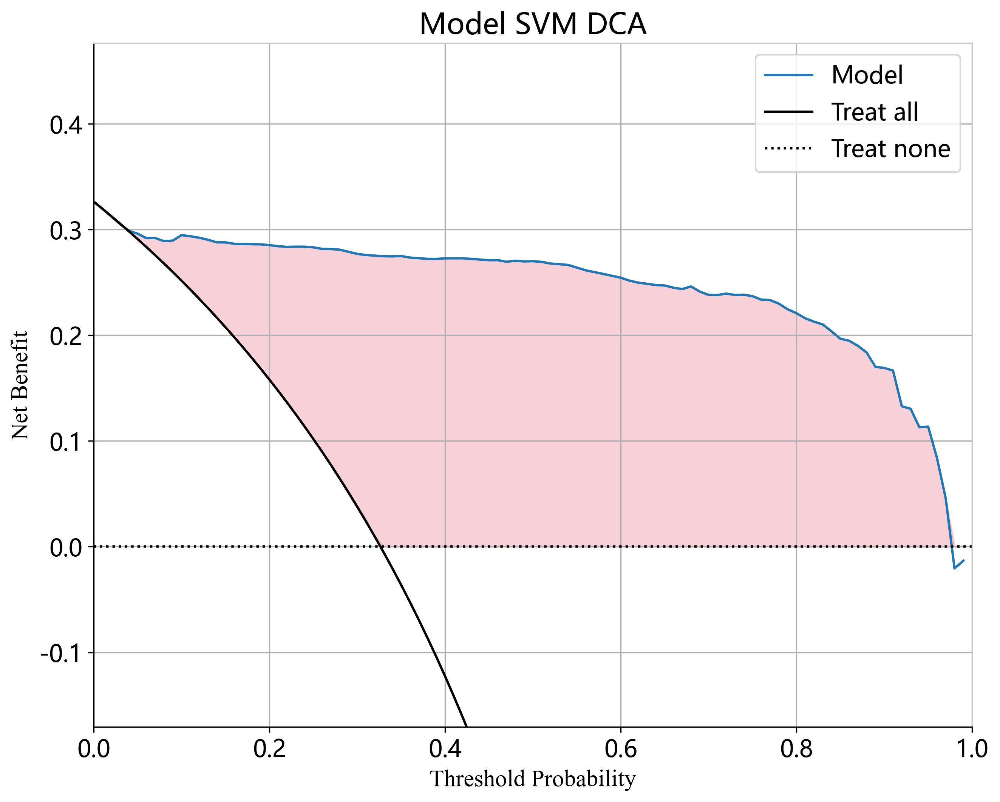

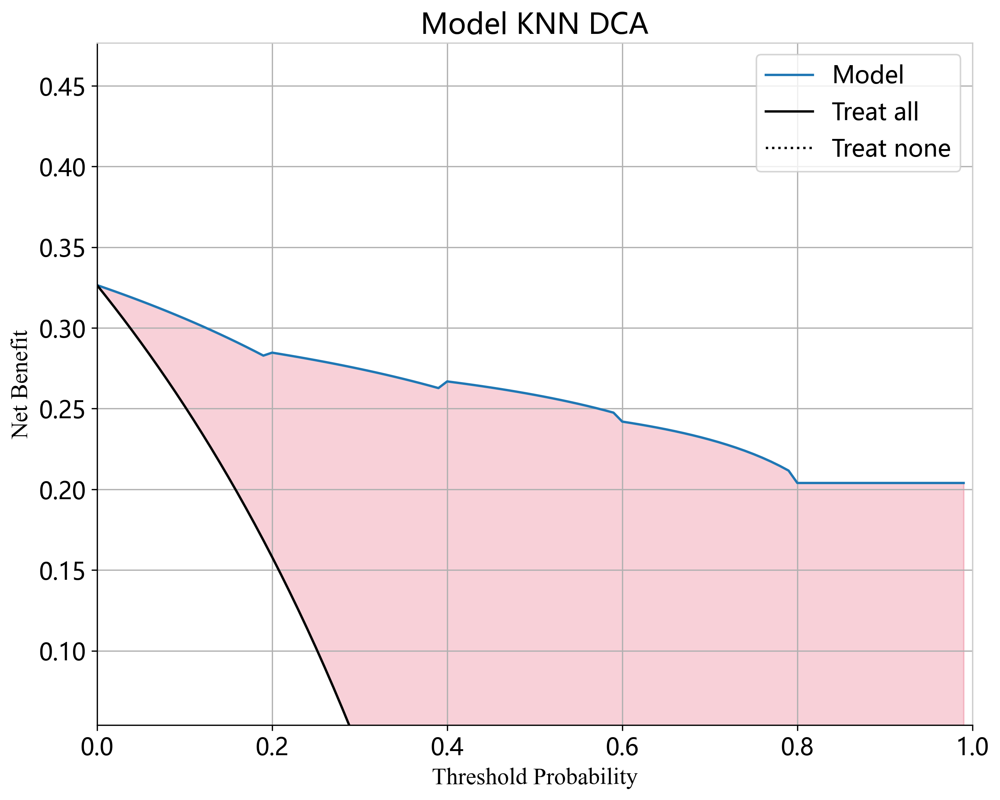

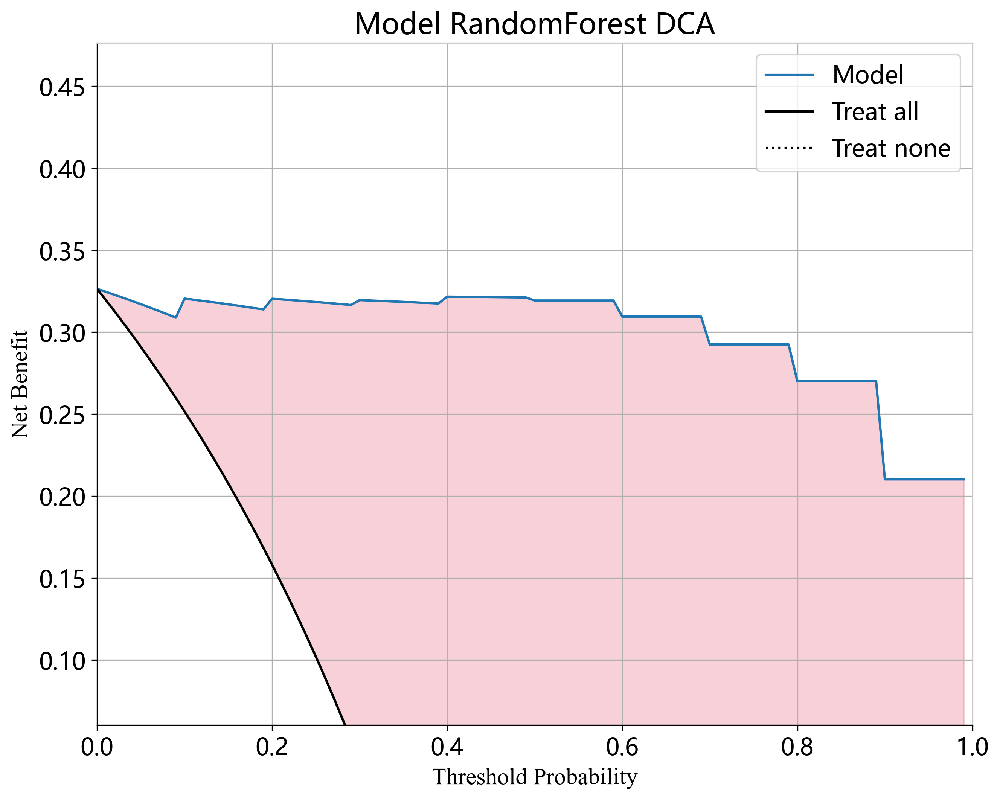

...

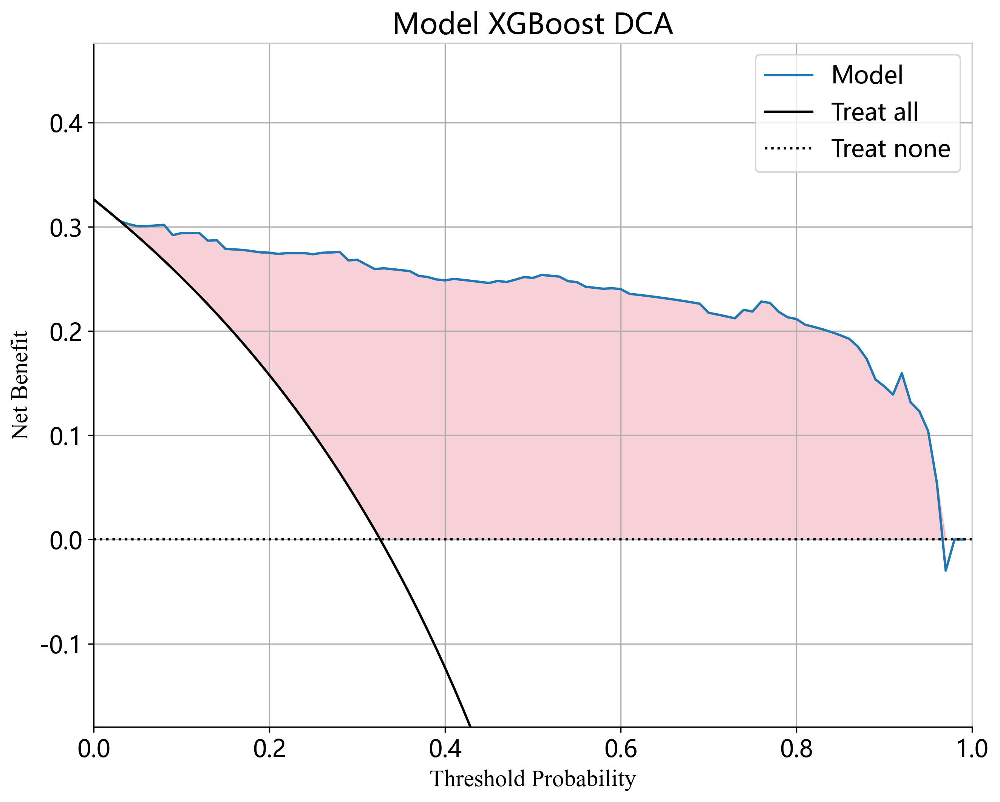

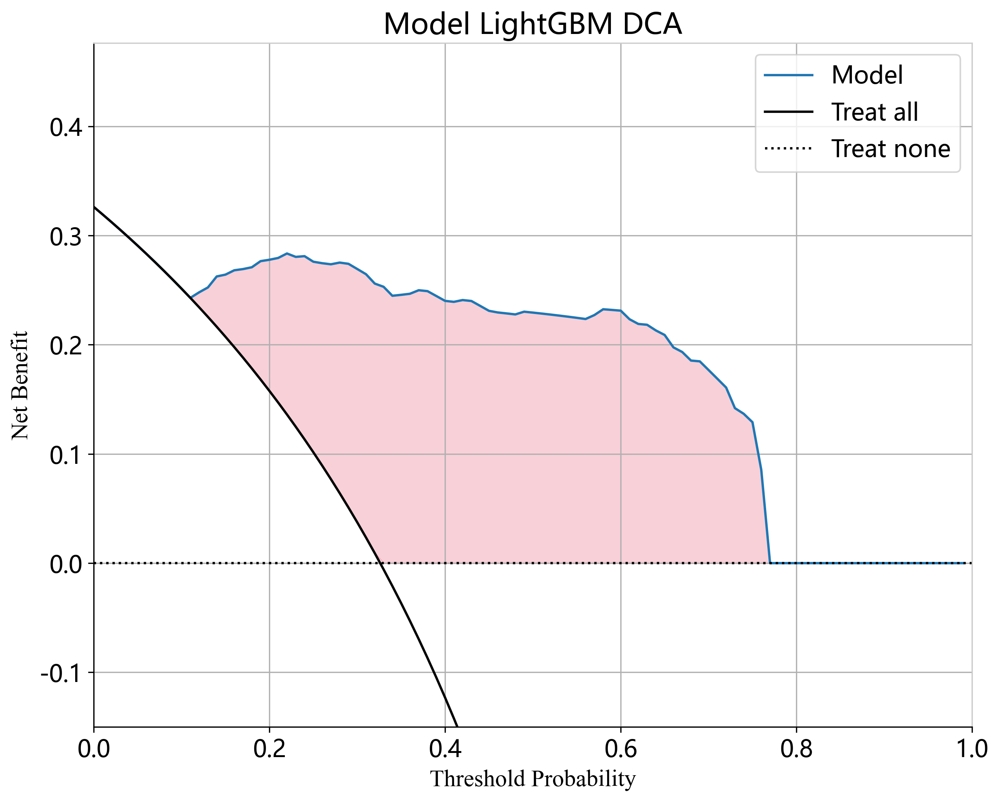

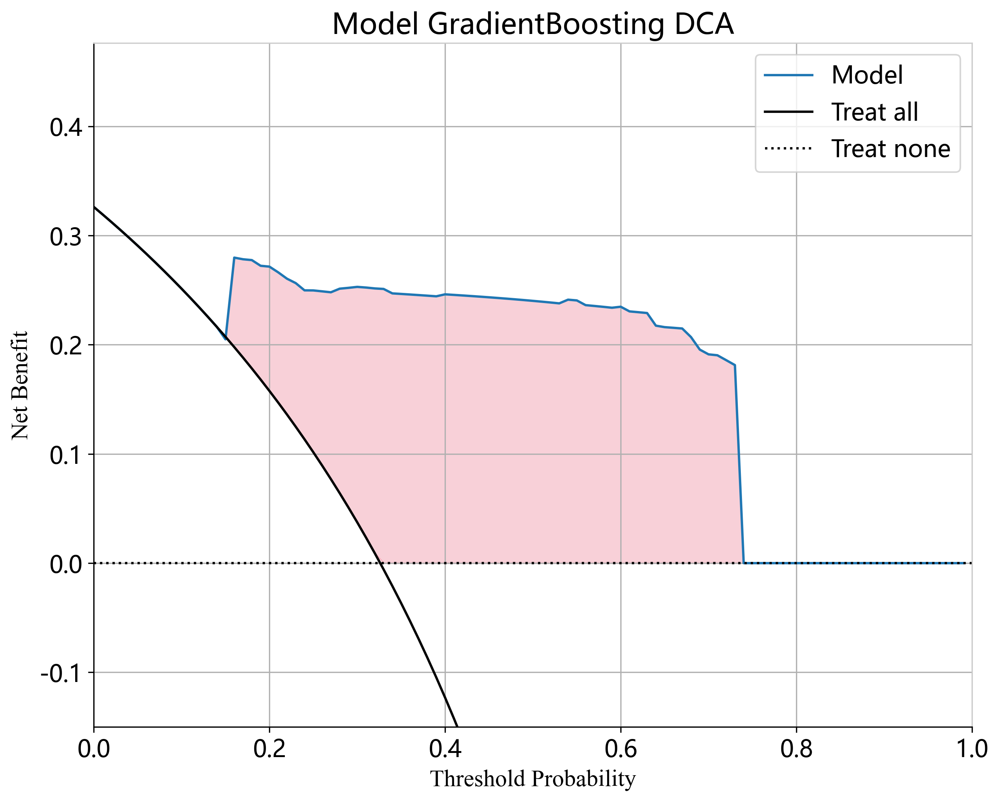

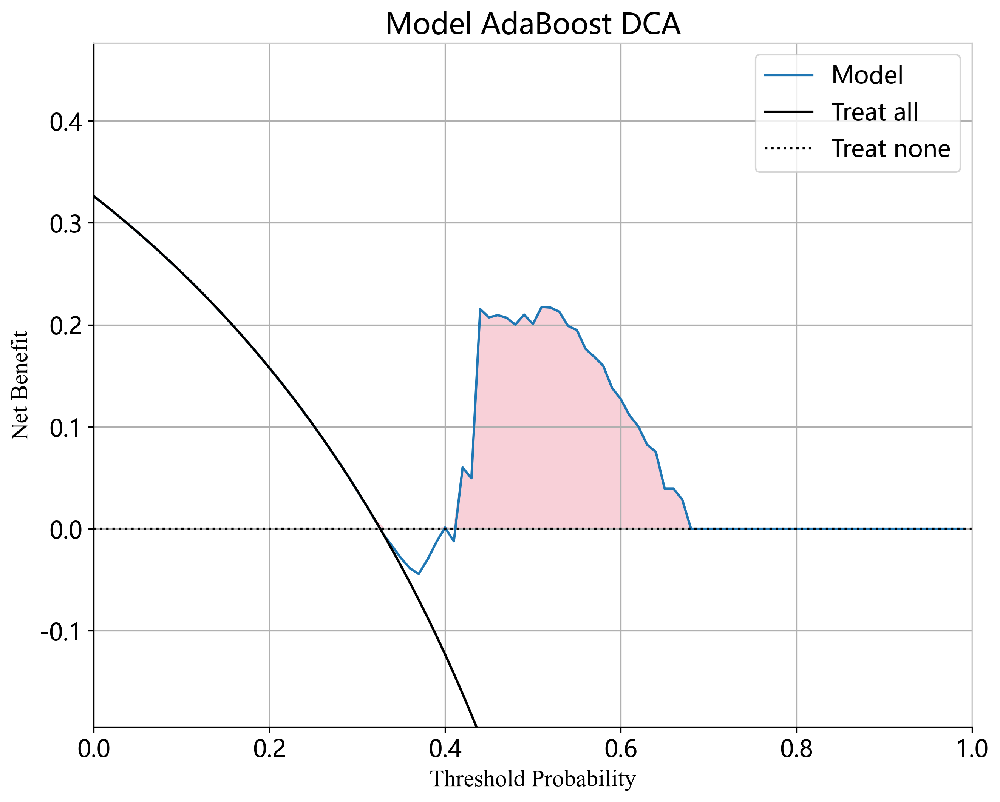

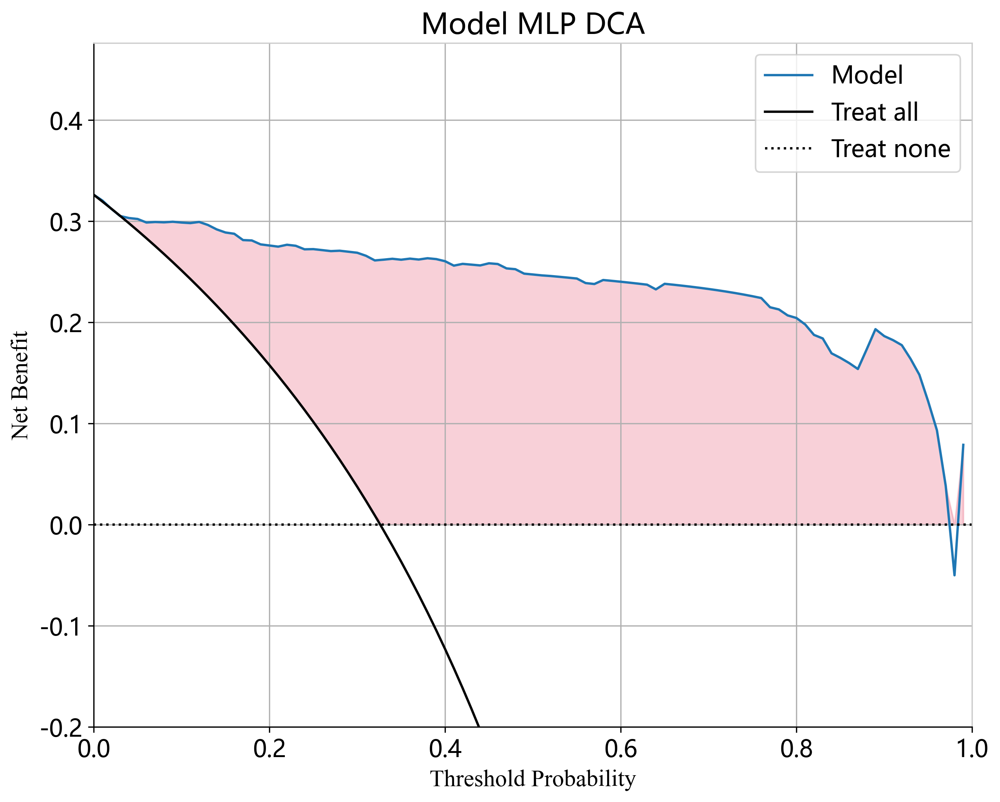

In [30]:
from onekey_algo.custom.components.comp1 import plot_DCA

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            okcomp.comp1.plot_DCA(pred_score[sel_model_idx][0][:,1], np.array(y_train_sel[label]),
                                  title=f'Model {sm} DCA')
            plt.savefig(f'img/model_{sm}_dca_train.svg', bbox_inches = 'tight')
            plt.show()

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            okcomp.comp1.plot_DCA(pred_score[sel_model_idx][1][:,1], np.array(y_test_sel[label]),
                                  title=f'Model {sm} DCA')
            plt.savefig(f'img/model_{sm}_dca_test.svg', bbox_inches = 'tight')

### 绘制混淆矩阵

绘制混淆矩阵，[混淆矩阵解释](https://baike.baidu.com/item/%E6%B7%B7%E6%B7%86%E7%9F%A9%E9%98%B5/10087822?fr=aladdin)
`sel_model = ['SVM', 'KNN']`参数为想要绘制的模型对应的参数。

如果需要修改标签到名称的映射，修改`class_mapping={1:'1', 0:'0'}`

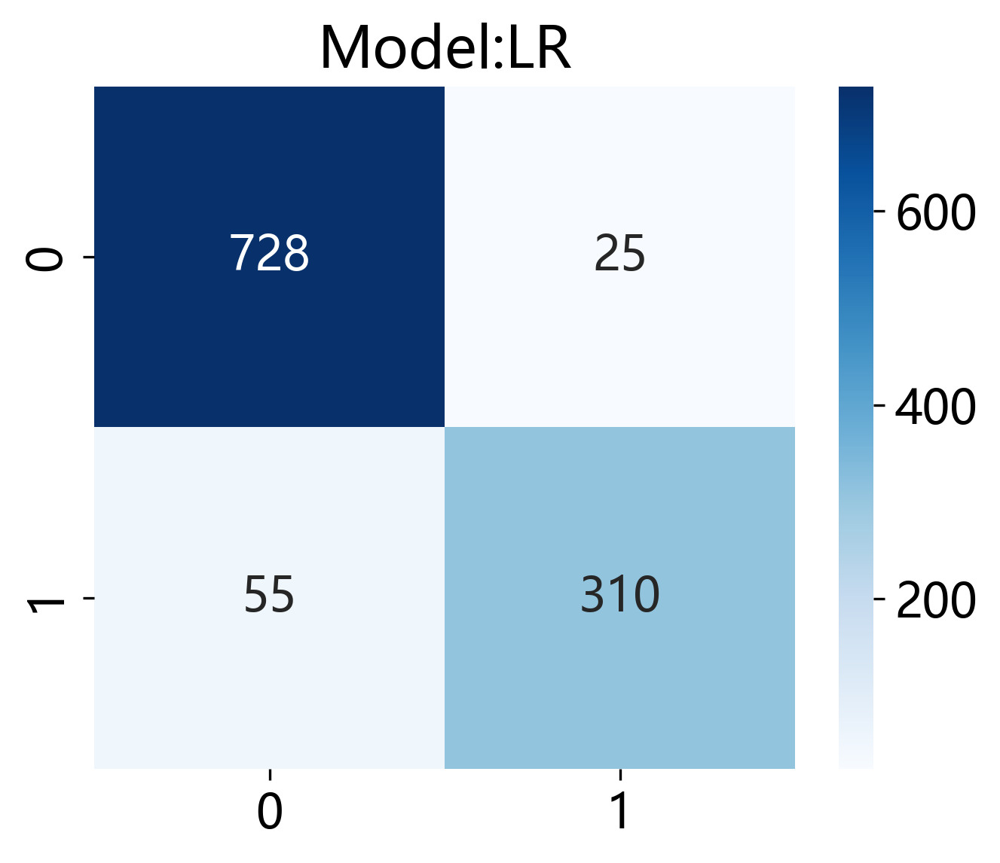

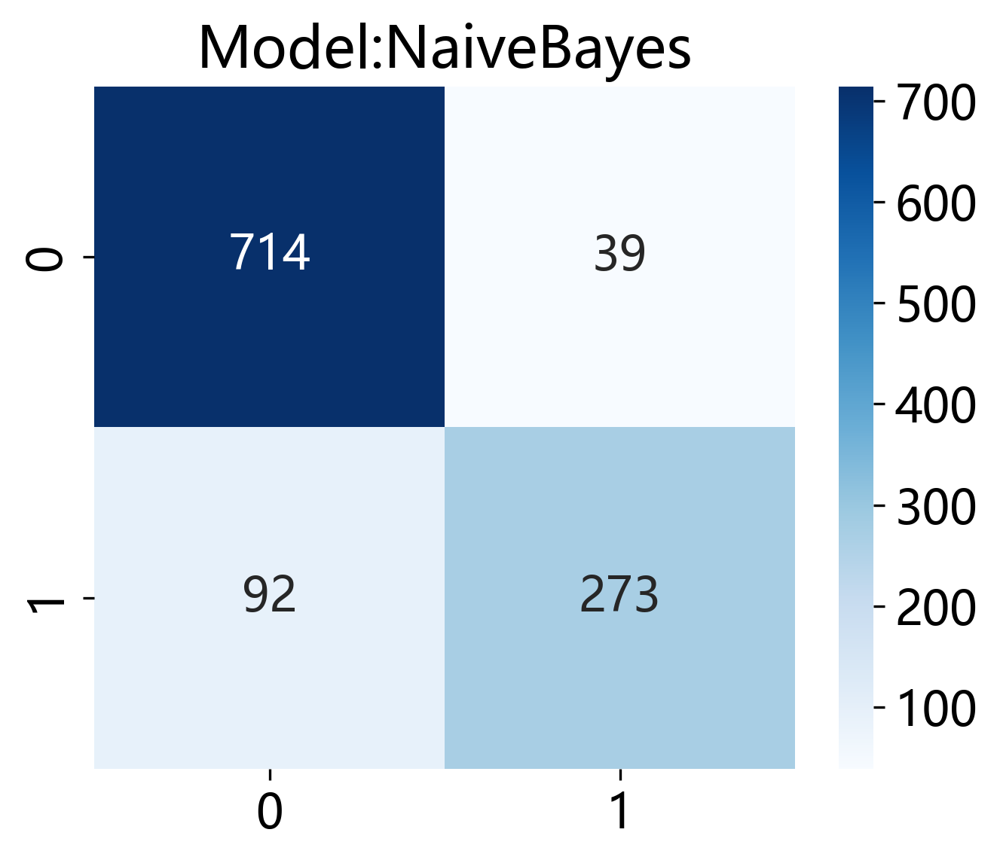

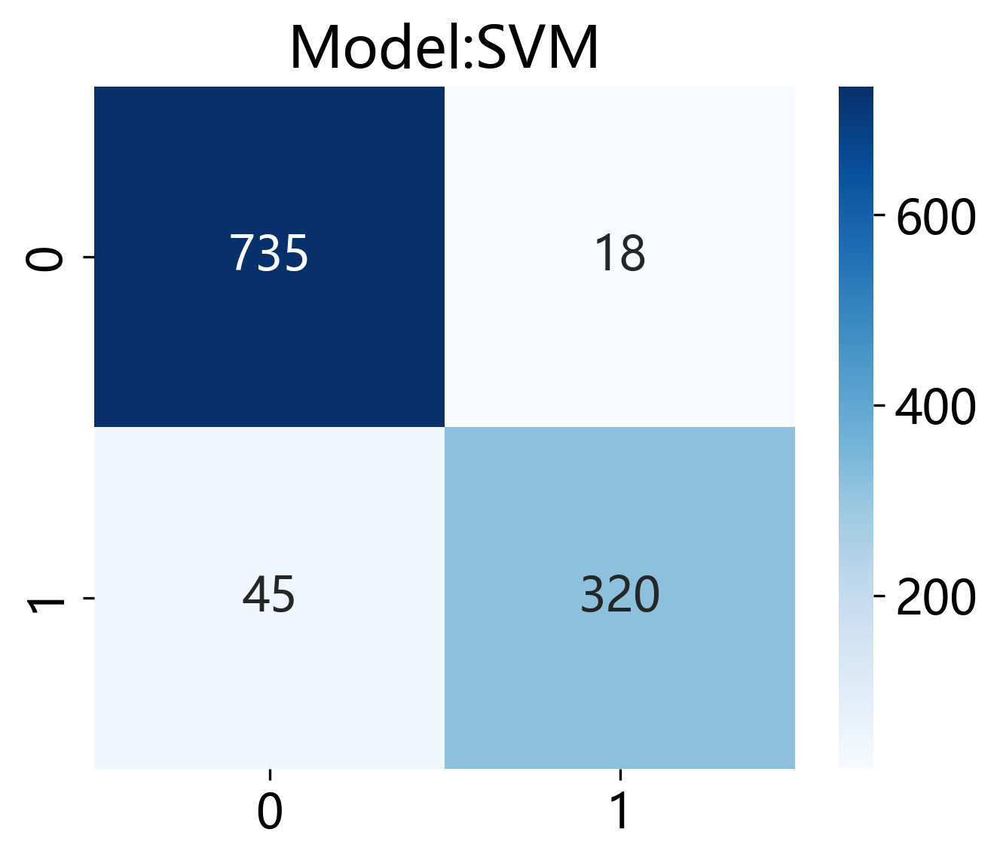

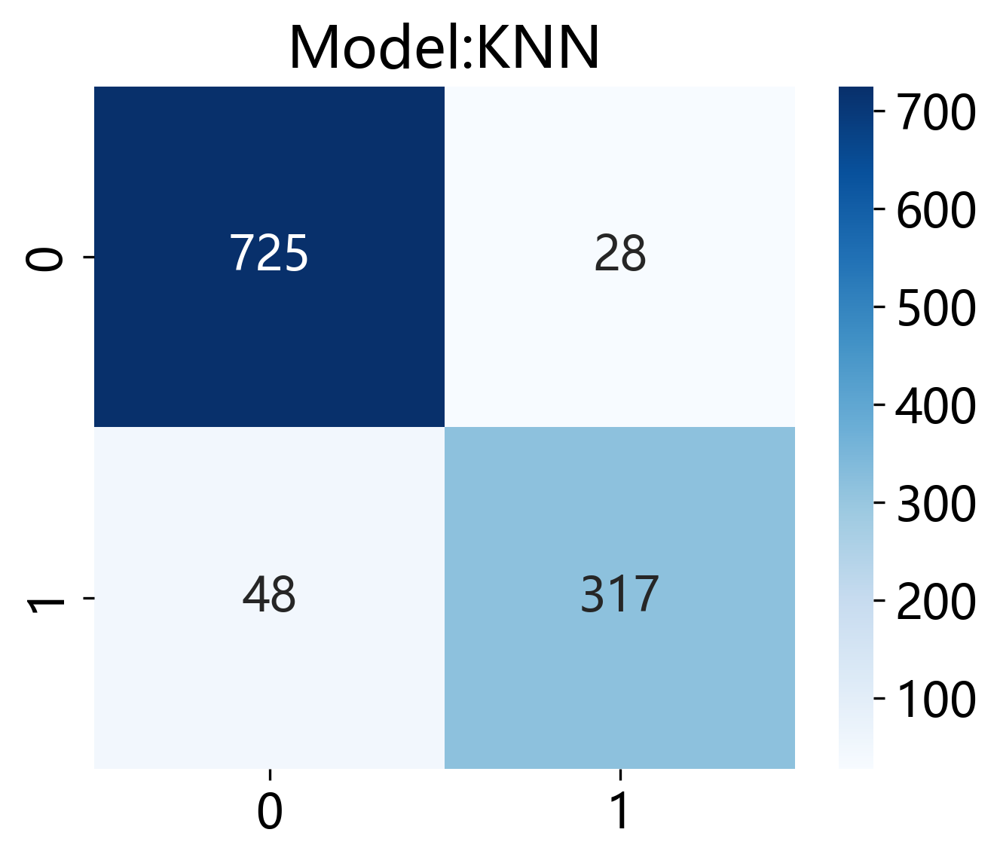

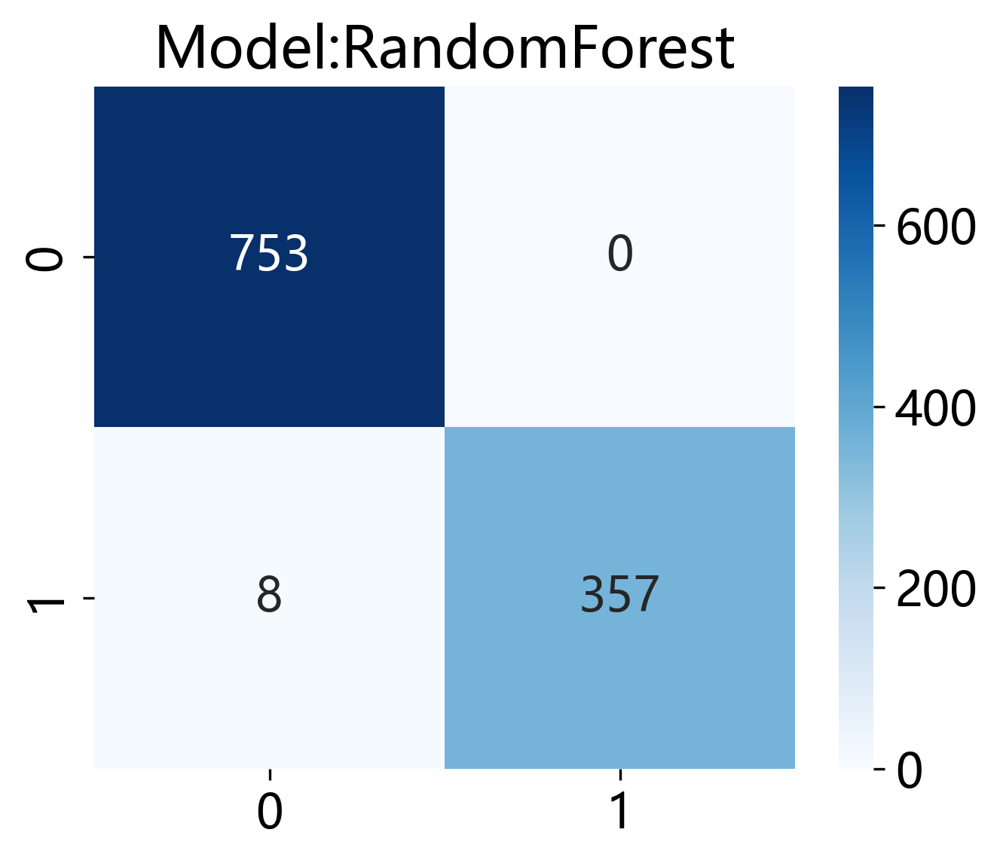

...

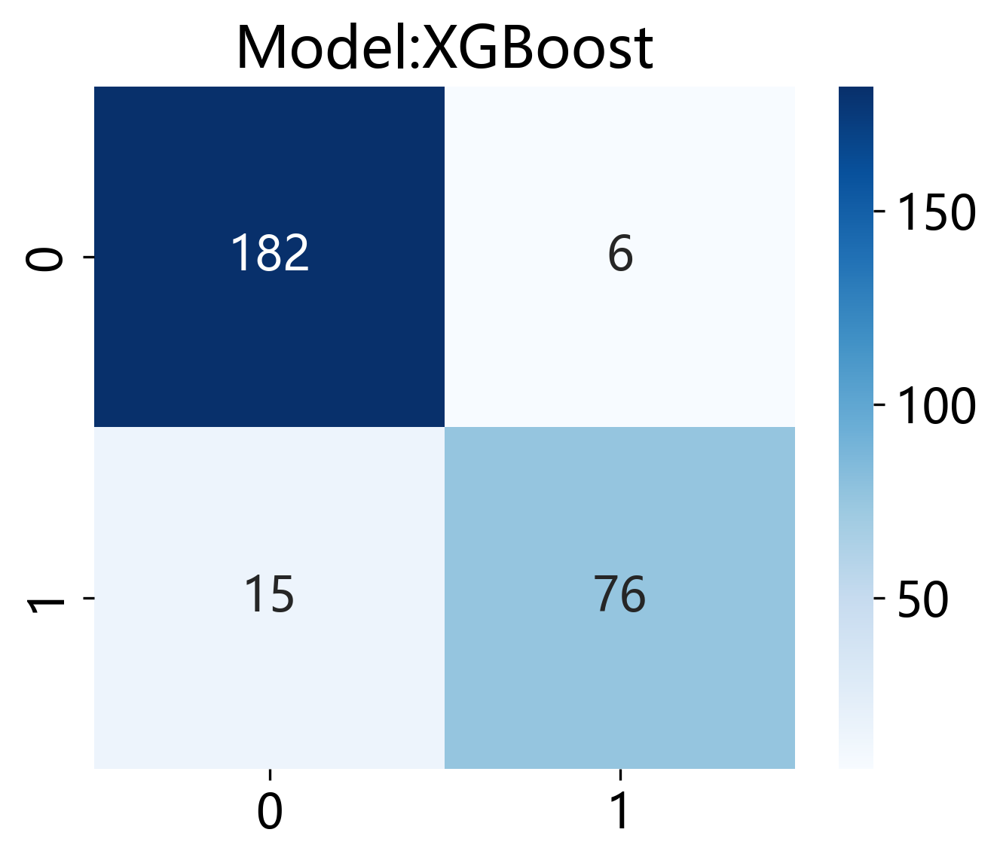

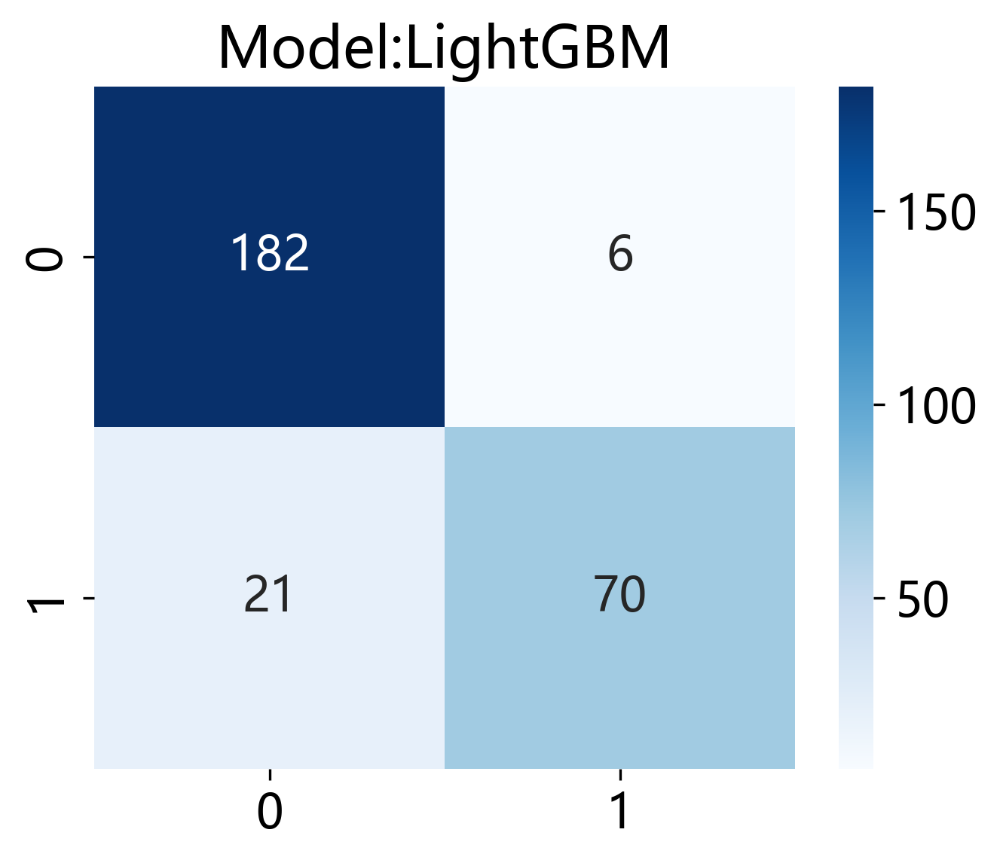

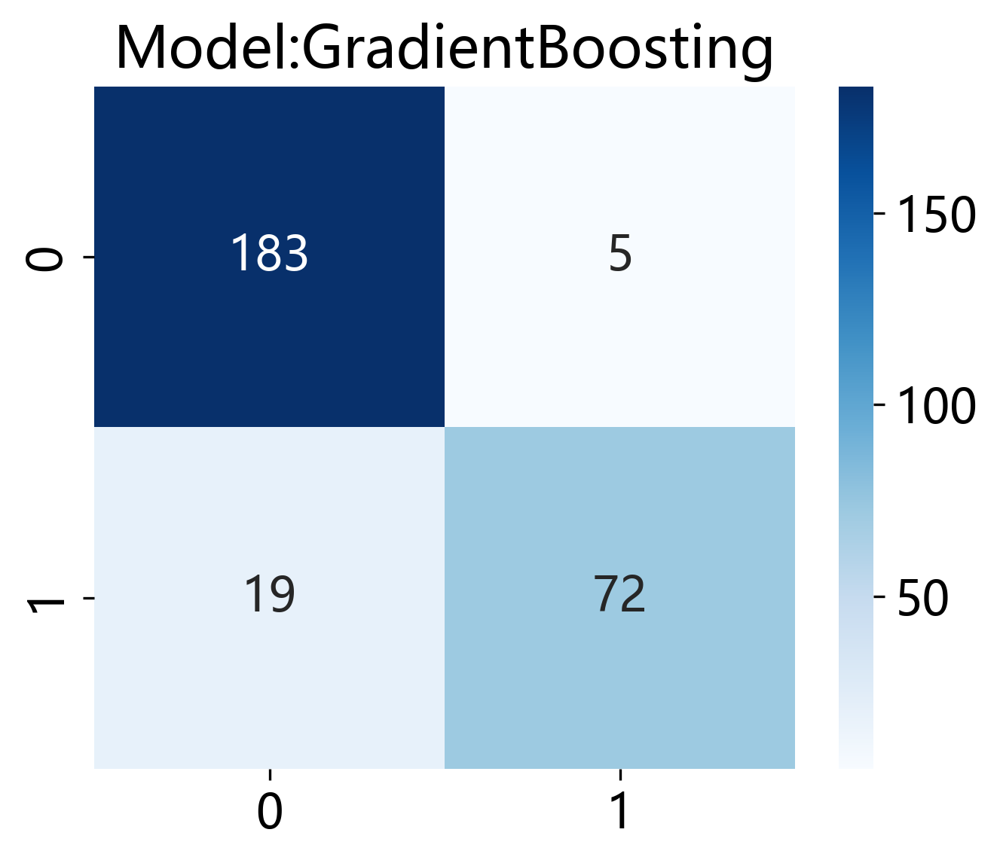

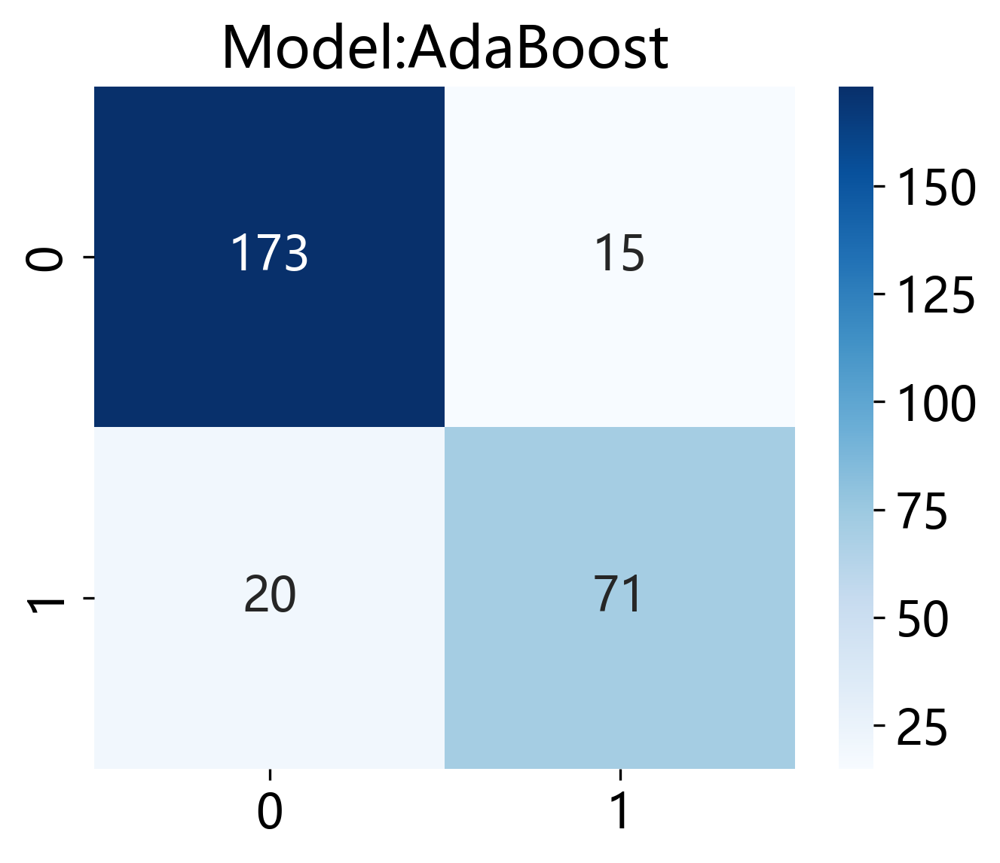

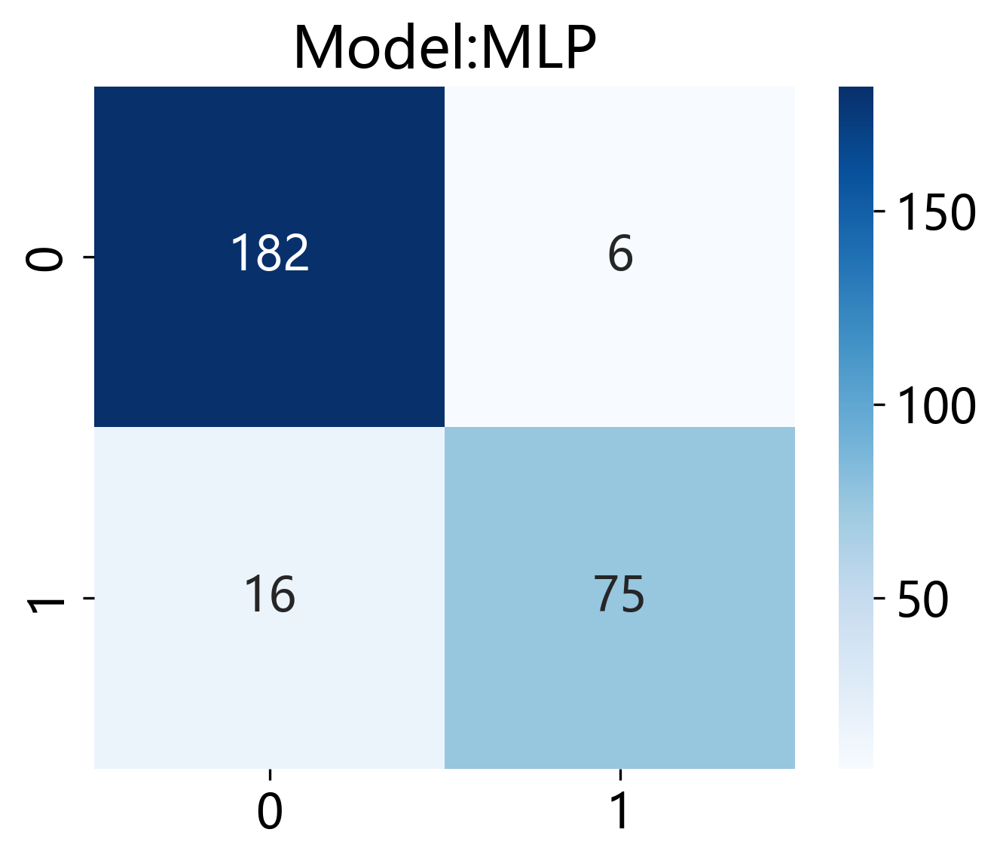

In [31]:
# 设置绘制参数
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):
            cm = okcomp.comp1.calc_confusion_matrix(predictions[idx][sel_model_idx][0], y_train_sel[label],
#                                                     sel_idx = pred_sel_idx[idx][sel_model_idx],
                                                    class_mapping={1:'1', 0:'0'}, num_classes=2)
            c_matrix[label] = cm
            plt.figure(figsize=(5, 4))
            plt.title(f'Model:{sm}')
            okcomp.comp1.draw_matrix(cm, norm=False, annot=True, cmap='Blues', fmt='.3g')
            plt.savefig(f'img/model_{sm}_cm_train.svg', bbox_inches = 'tight')

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):
            cm = okcomp.comp1.calc_confusion_matrix(predictions[idx][sel_model_idx][-1], y_test_sel[label],
#                                                     sel_idx = pred_sel_idx[idx][sel_model_idx],
                                                    class_mapping={1:'1', 0:'0'}, num_classes=2)
            c_matrix[label] = cm
            plt.figure(figsize=(5, 4))
            plt.title(f'Model:{sm}')
            okcomp.comp1.draw_matrix(cm, norm=False, annot=True, cmap='Blues', fmt='.3g')
            plt.savefig(f'img/model_{sm}_cm_test.svg', bbox_inches = 'tight')

### 样本预测直方图

绘制每个样本的预测结果以及对应的真实结果, 图例中label=xx可以修改成自己类别的真实标签。

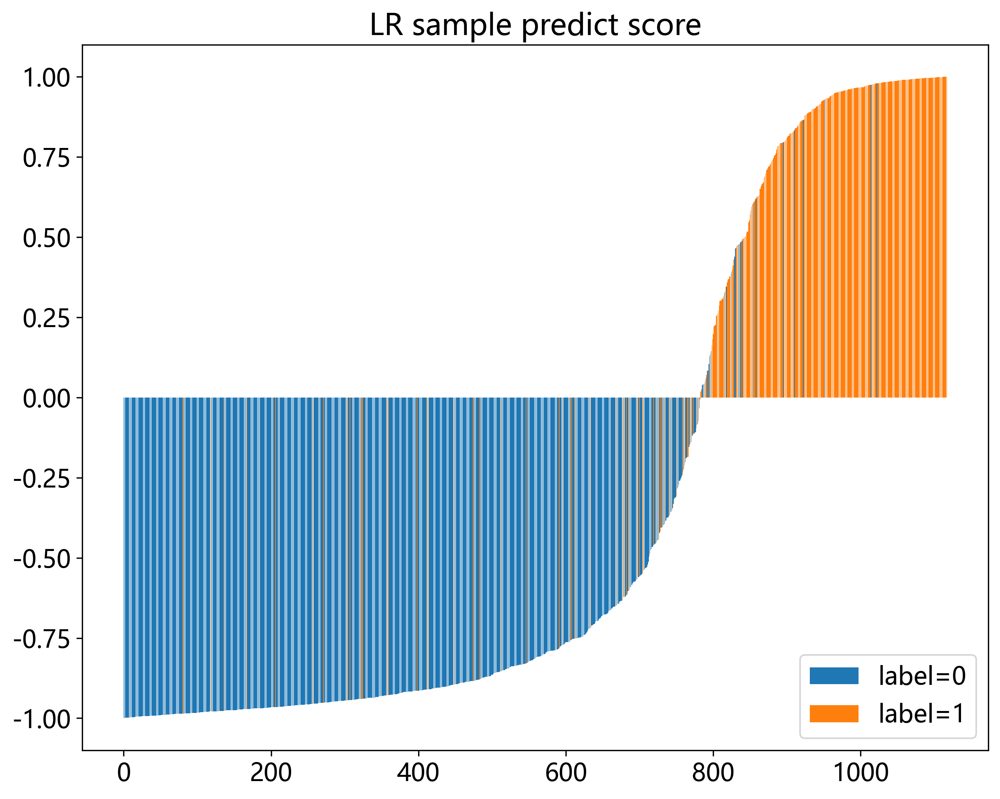

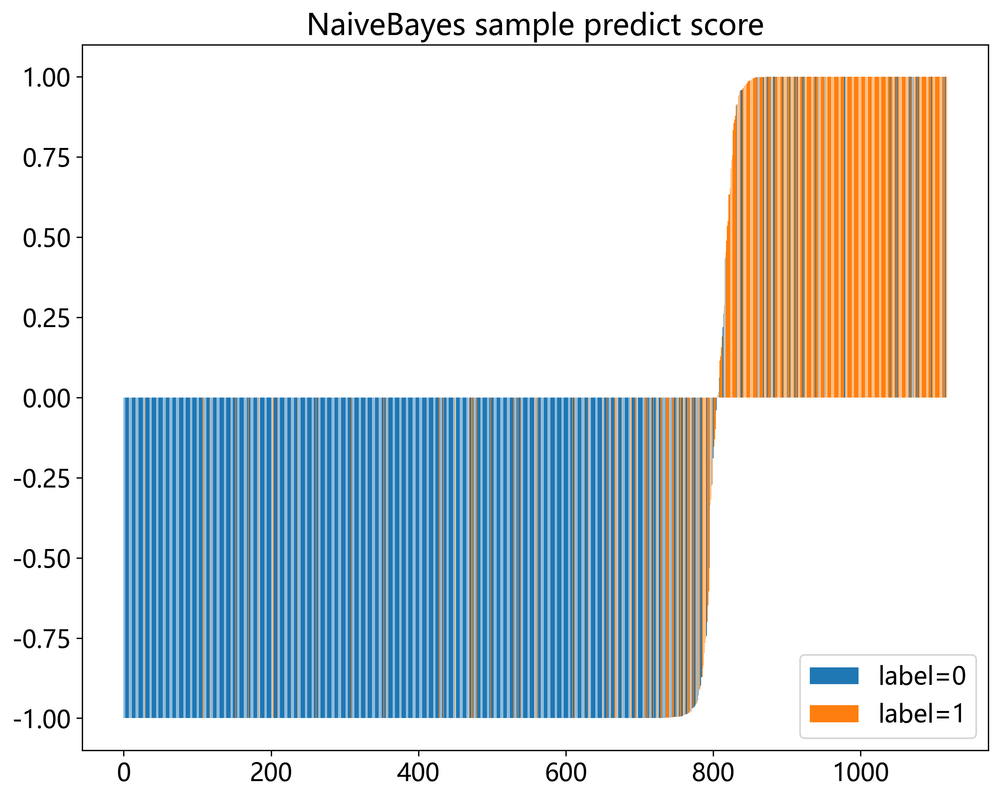

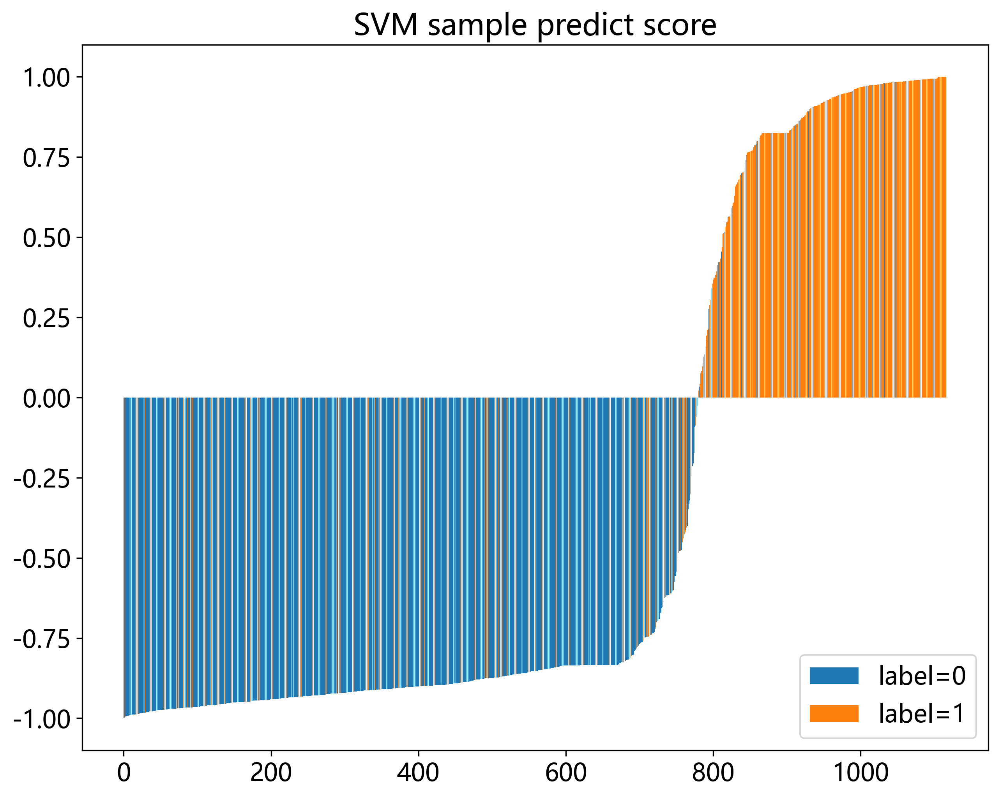

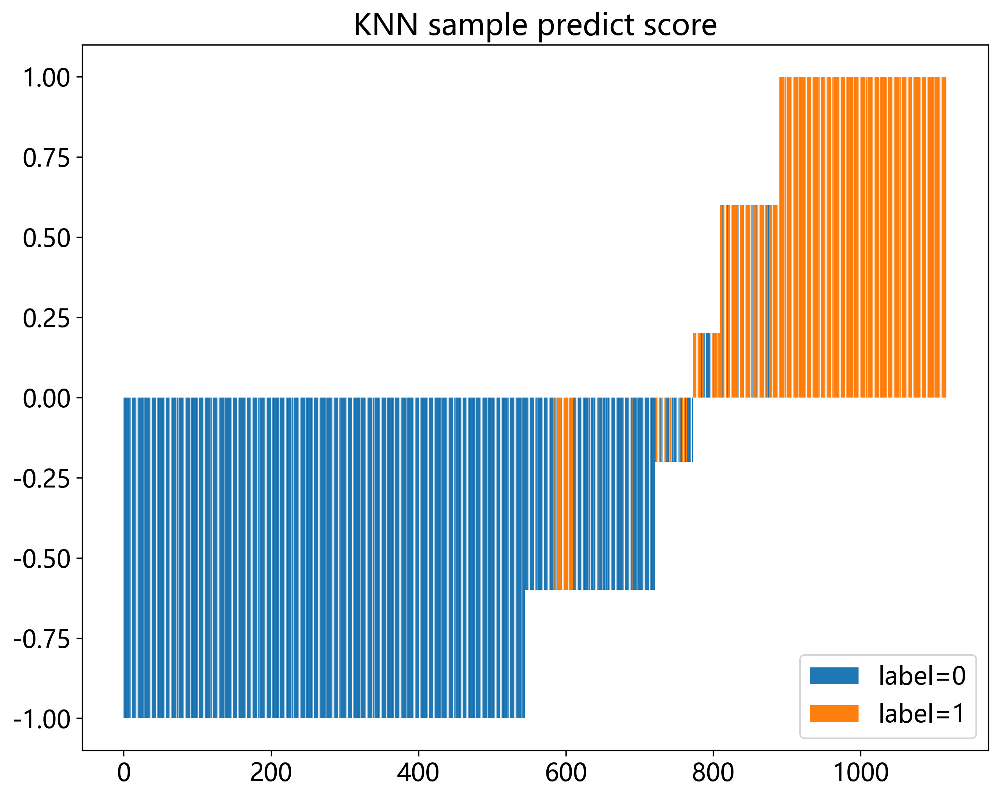

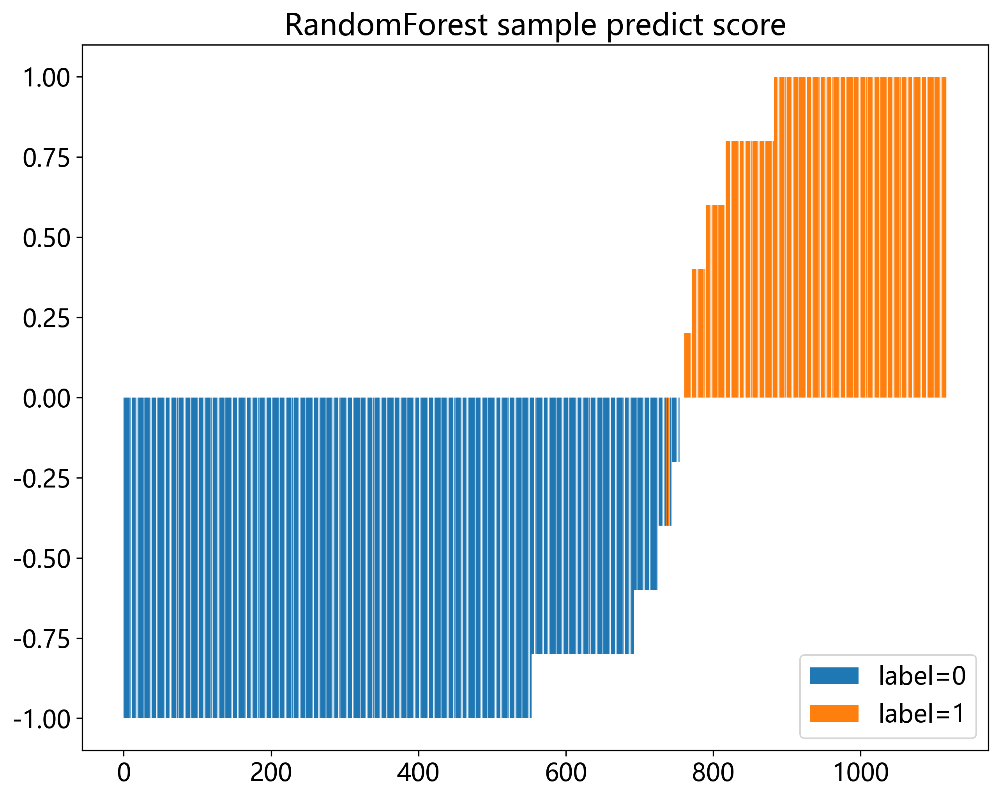

...

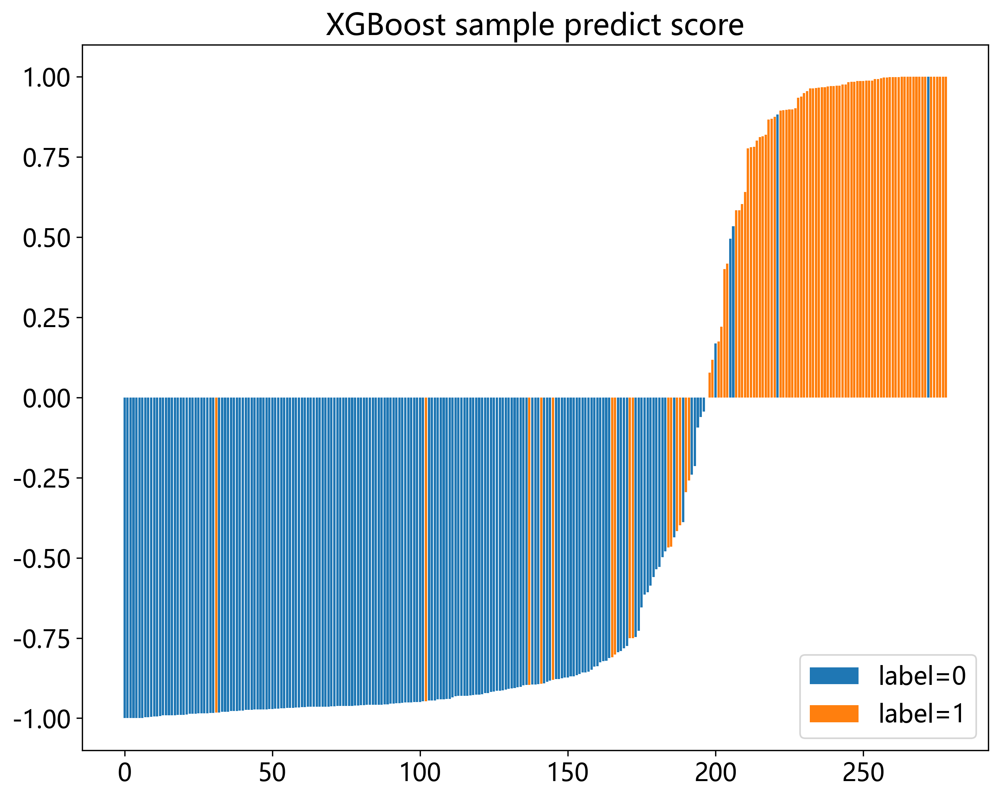

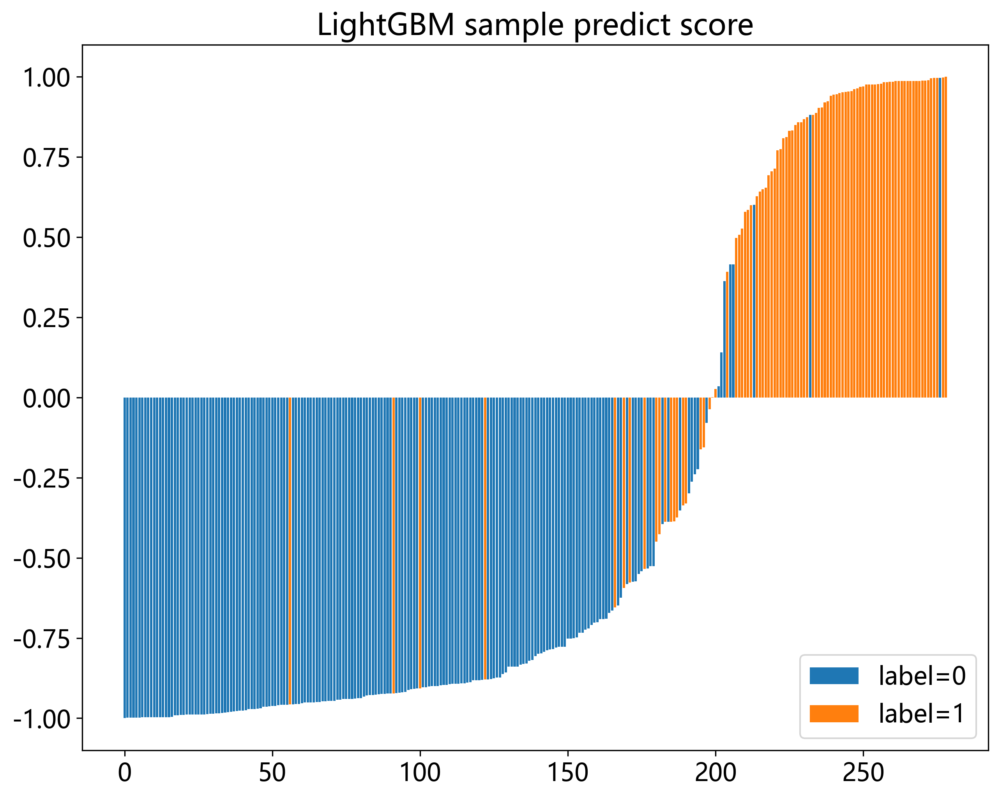

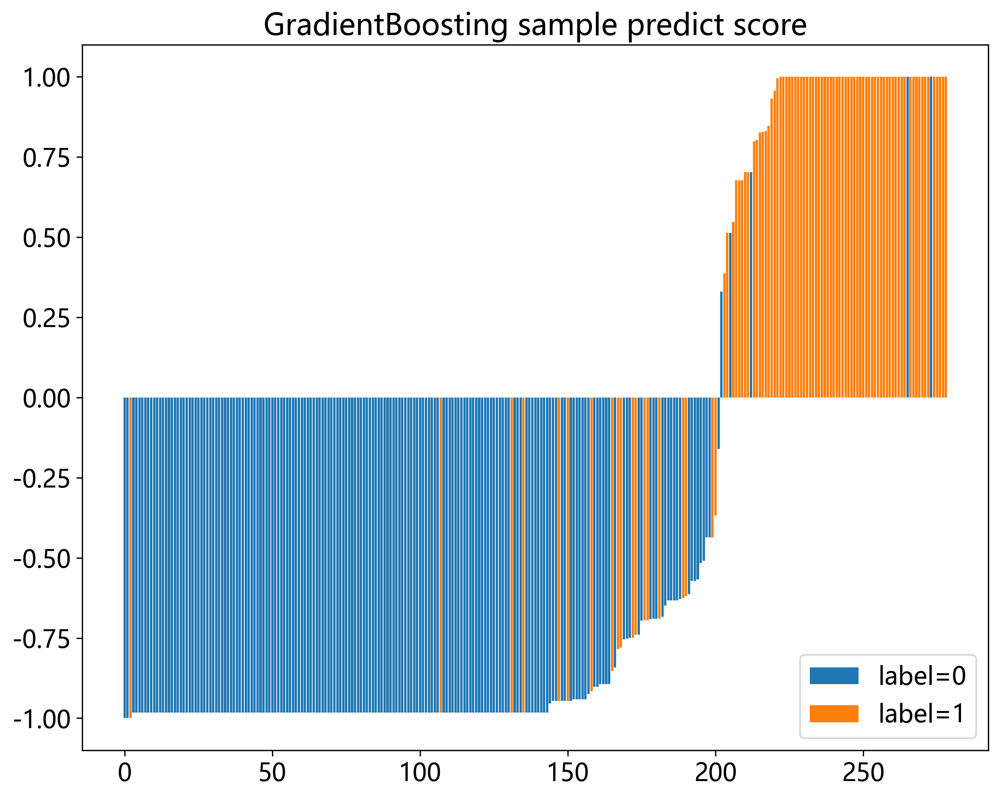

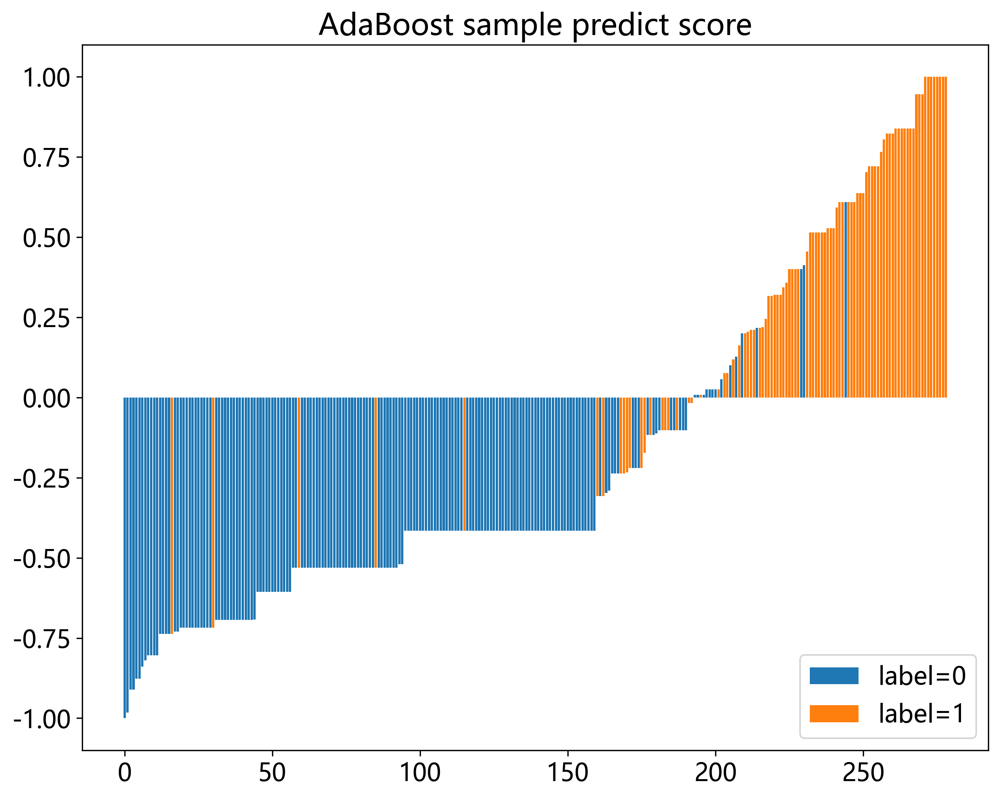

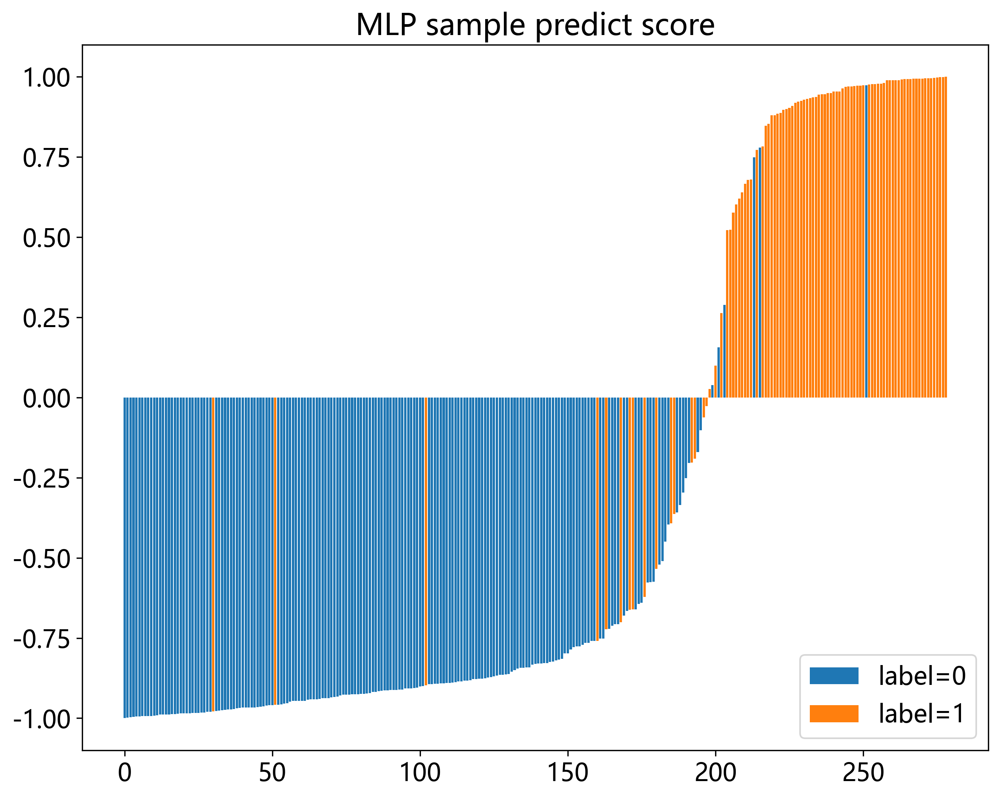

In [32]:
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):            
            okcomp.comp1.draw_predict_score(pred_scores[idx][sel_model_idx][0], y_train_sel[label])
            plt.title(f'{sm} sample predict score')
            plt.legend(labels=["label=0","label=1"],loc="lower right") 
            plt.savefig(f'img/model_{sm}_sample_dis_train.svg', bbox_inches = 'tight')
            plt.show()

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):            
            okcomp.comp1.draw_predict_score(pred_scores[idx][sel_model_idx][-1], y_test_sel[label])
            plt.title(f'{sm} sample predict score')
            plt.legend(labels=["label=0","label=1"],loc="lower right") 
            plt.savefig(f'img/model_{sm}_sample_dis_test.svg', bbox_inches = 'tight')
            plt.show()

## 保存模型结果

可以把模型预测的标签结果以及每个类别的概率都保存下来。

In [33]:
import os
import numpy as np

os.makedirs('results', exist_ok=True)
sel_model = sel_model

for idx, label in enumerate(labels):
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            target = targets[idx][sel_model_idx]
            # 预测训练集和测试集数据。
            train_indexes = np.reshape(np.array(ids.loc[list(X_train_sel.index)]), (-1, 1)).astype(str)
            test_indexes = np.reshape(np.array(ids.loc[list(X_test_sel.index)]), (-1, 1)).astype(str)
            y_train_pred_scores = target.predict_proba(X_train_sel)
            y_test_pred_scores = target.predict_proba(X_test_sel)
            columns = ['ID'] + [f"{label}-{i}"for i in range(y_test_pred_scores.shape[1])]
            # 保存预测的训练集和测试集结果
            result_train = pd.DataFrame(np.concatenate([train_indexes, y_train_pred_scores], axis=1), columns=columns)
            result_train.to_csv(f'results/{sm}_train.csv', index=False)
            result_test = pd.DataFrame(np.concatenate([test_indexes, y_test_pred_scores], axis=1), columns=columns)
            result_test.to_csv(f'results/{sm}_test.csv', index=False)